# 3er Parcial, 26-nov-2025
### Elaboró: Anette Paulina González Solano
__Dataset a utilizar__: https://physionet.org/content/eegmmidb/1.0.0/S001/#files-panel

__Descripción del dataset:__ Registros de EEG de 64 canales, 109 sujetos, 14 ensayos por sujeto.

Basales (1 minuto): 
- R01 – Reposo, ojos abiertos
- R02 – Reposo, ojos cerrados

Tareas (2 minutos c/u): Cada tarea se repite x3.
- Tarea 1 (real): mover mano izquierda o derecha.
- Tarea 2 (imaginada): imaginar mover mano izquierda o derecha.
- Tarea 3 (real): mover ambas manos (sup) o mover los pies (inf).
- Tarea 4 (imaginada): imaginar mover ambas manos (sup) o los pies (inf).

Eventos:
- T0: reposo.
- T1: movimiento/imaginar movimiento de: mano izquierda (en Tareas 1 y 2) o ambas manos (en Tareas 3 y 4).
- T2: movimiento/imaginar movimiento de: mano derecha (en Tareas 1 y 2) o pies (en Tareas 3 y 4).

## Ensayos 3 y 4

In [1]:
# Importar librerías
import numpy as np
import pandas as pd
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Rutas de los archivos de los ensayos EEG
ruta_ensayo3 = r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_03.xlsx"
ruta_ensayo4 = r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_04.xlsx"
# Ruta de coordenadas XYZ
ruta_coord = r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\MI_coordinates.csv"
# Cargar hojas de Excel como diccionarios de DataFrames
ensayo3_dict = pd.read_excel(ruta_ensayo3, sheet_name=None, index_col=0)
ensayo4_dict = pd.read_excel(ruta_ensayo4, sheet_name=None, index_col=0)
# Convertir diccionarios en listas de DataFrames (más fácil de recorrer)
ensayo3_dfs = [df for df in ensayo3_dict.values()]
ensayo4_dfs = [df for df in ensayo4_dict.values()]
# Cargar coordenadas XYZ de electrodos
coords = pd.read_csv(ruta_coord)
coords.set_index("canal", drop=True, inplace=True)

In [2]:
# Función para filtrar matrices (binarización)
def filtrar(lista_dfs, threshold, porcentaje):
    stack = np.stack([df.values for df in lista_dfs])      # Apilar todas las matrices (sujetos x canales x canales)
    above = stack > threshold                              # True si supera el umbral
    N = len(lista_dfs)
    count_above = above.sum(axis=0)                        # Cuántos sujetos superan el umbral en cada celda
    min_requerido = int(np.ceil(porcentaje * N))           # Número mínimo requerido de sujetos
    result_bool = count_above >= min_requerido             # Matriz binaria final
    return pd.DataFrame(result_bool,
                        index=lista_dfs[0].index,
                        columns=lista_dfs[0].columns)

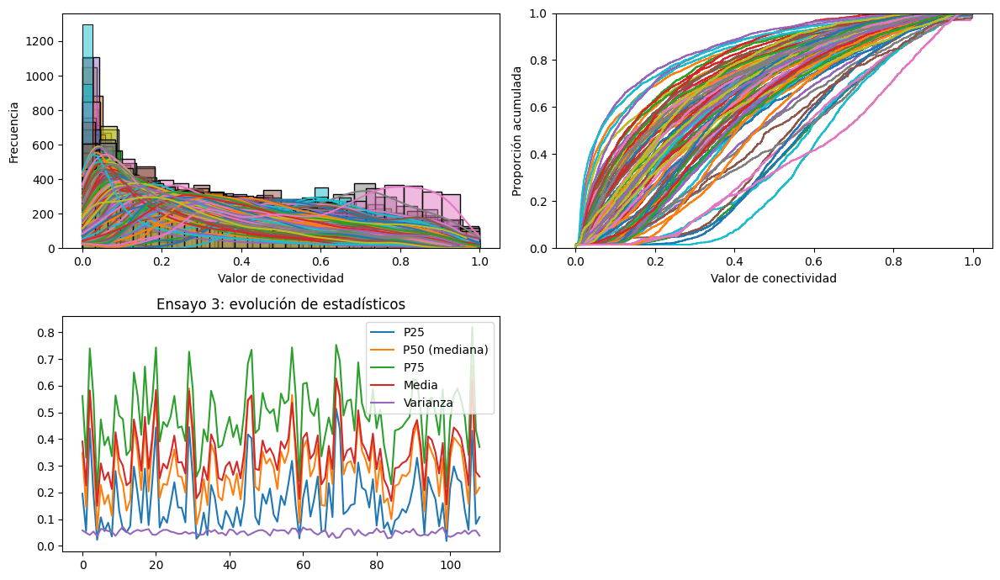

Estadísticos globales Ensayo 3:
              th25      th50      th75     media  mu_sigma
min      0.018413  0.061750  0.196867  0.149821  0.186222
max      0.514472  0.674805  0.819681  0.626848  0.676548
mediana  0.144574  0.273808  0.484181  0.327700  0.389466
mad      0.069559  0.080172  0.074567  0.063494  0.060276


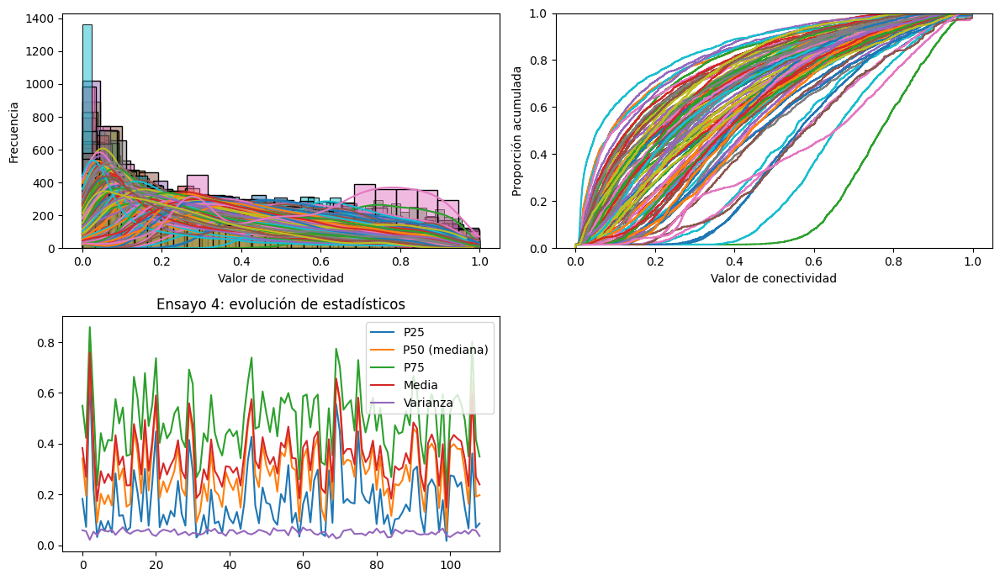

Estadísticos globales Ensayo 4:
              th25      th50      th75     media  mu_sigma
min      0.016915  0.055561  0.210152  0.148728  0.186648
max      0.680820  0.768026  0.859416  0.758803  0.780441
mediana  0.135265  0.288254  0.480688  0.333706  0.384217
mad      0.066142  0.090804  0.077428  0.068714  0.067877


In [3]:
# Estadísticos para umbrales
def calcular_estadisticos(lista_dfs, nombre):
    th25, th50, th75, medias, varianzas, mu_sigma = [], [], [], [], [], []
    fig, axes = plt.subplots(2, 2, figsize=(12, 7))

    for sujeto in lista_dfs:
        data = sujeto.stack().values
        th25.append(np.percentile(data, 25))
        th50.append(np.percentile(data, 50))
        th75.append(np.percentile(data, 75))
        medias.append(np.mean(data))
        varianzas.append(np.var(data))
        mu_sigma.append(np.mean(data) + np.var(data))

        # Distribuciones por sujeto
        sns.histplot(data, ax=axes[0, 0], kde=True)
        axes[0, 0].set_xlabel("Valor de conectividad")
        axes[0, 0].set_ylabel("Frecuencia")
        sns.ecdfplot(data, ax=axes[0, 1])
        axes[0, 1].set_xlabel("Valor de conectividad")
        axes[0, 1].set_ylabel("Proporción acumulada")

    # Evolución de métricas
    axes[1, 0].plot(th25, label="P25")
    axes[1, 0].plot(th50, label="P50 (mediana)")
    axes[1, 0].plot(th75, label="P75")
    axes[1, 0].plot(medias, label="Media")
    axes[1, 0].plot(varianzas, label="Varianza")
    axes[1, 0].legend()
    axes[1, 0].set_title(f"{nombre}: evolución de estadísticos")
    axes[1, 1].axis("off")
    plt.tight_layout(); plt.show()

    # Tabla resumen
    estadisticos_df = pd.DataFrame(columns=['th25','th50','th75','media','mu_sigma'],
                                   index=['min','max','mediana','mad'])
    columnas = [th25, th50, th75, medias, mu_sigma]
    for idx, columna in enumerate(estadisticos_df.columns):
        estadisticos_df[columna] = [
            np.min(columnas[idx]),
            np.max(columnas[idx]),
            np.median(columnas[idx]),
            stats.median_abs_deviation(columnas[idx])
        ]
    print(f"Estadísticos globales {nombre}:\n", estadisticos_df)
    return estadisticos_df

# Calcular estadísticos para ambos ensayos
estadisticos3 = calcular_estadisticos(ensayo3_dfs, "Ensayo 3")
estadisticos4 = calcular_estadisticos(ensayo4_dfs, "Ensayo 4")

# Thresholds justificados según resultados
threshold_mediana = 0.3
threshold_p75     = 0.5
poblacion_media   = 0.6
poblacion_alta    = 0.8

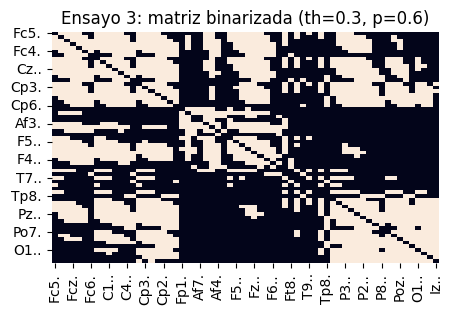

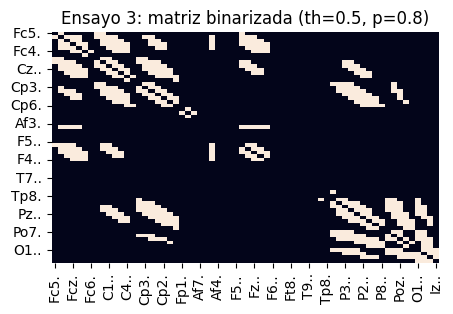

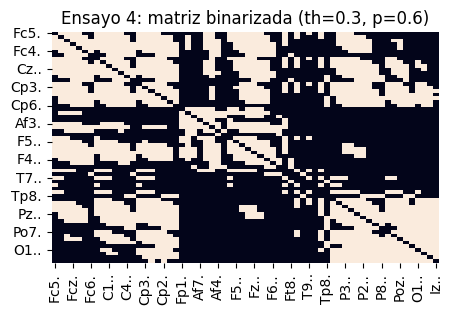

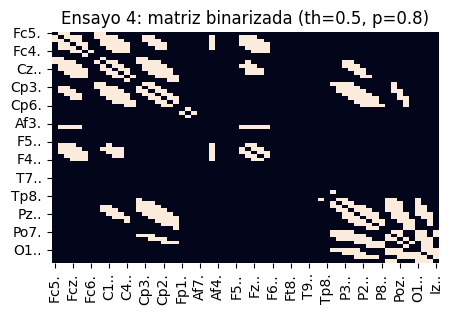

In [4]:
# Filtrado y heatmaps para cada ensayo

resultado3_mediana = filtrar(ensayo3_dfs, threshold_mediana, poblacion_media)
resultado3_p75     = filtrar(ensayo3_dfs, threshold_p75, poblacion_alta)
resultado4_mediana = filtrar(ensayo4_dfs, threshold_mediana, poblacion_media)
resultado4_p75     = filtrar(ensayo4_dfs, threshold_p75, poblacion_alta)

# Heatmaps
plt.figure(figsize=(5, 3))
sns.heatmap(resultado3_mediana, cbar=False)
plt.title("Ensayo 3: matriz binarizada (th=0.3, p=0.6)")
plt.show()

plt.figure(figsize=(5, 3))
sns.heatmap(resultado3_p75, cbar=False)
plt.title("Ensayo 3: matriz binarizada (th=0.5, p=0.8)")
plt.show()

plt.figure(figsize=(5, 3))
sns.heatmap(resultado4_mediana, cbar=False)
plt.title("Ensayo 4: matriz binarizada (th=0.3, p=0.6)")
plt.show()

plt.figure(figsize=(5, 3))
sns.heatmap(resultado4_p75, cbar=False)
plt.title("Ensayo 4: matriz binarizada (th=0.5, p=0.8)")
plt.show()

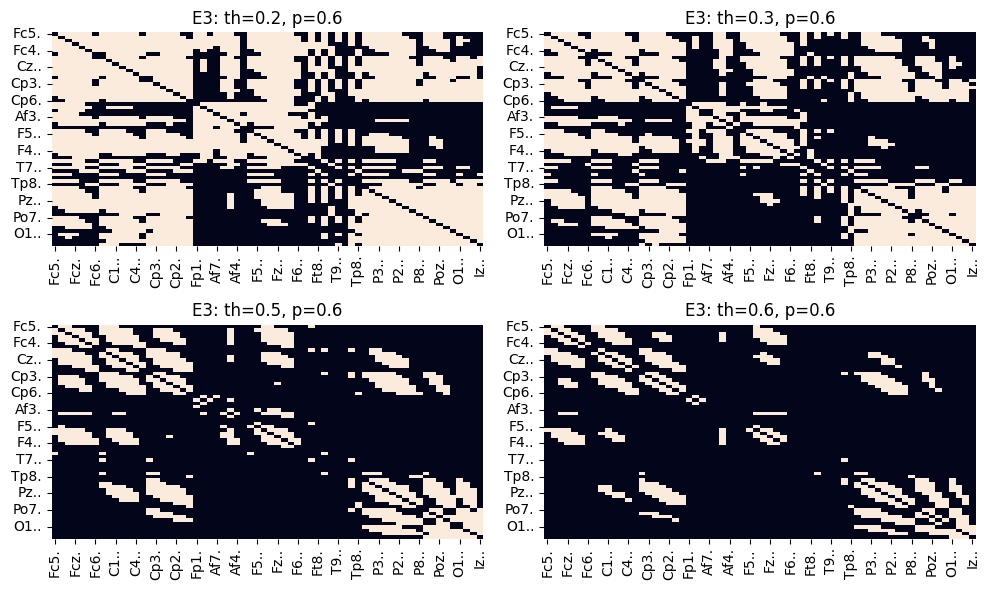

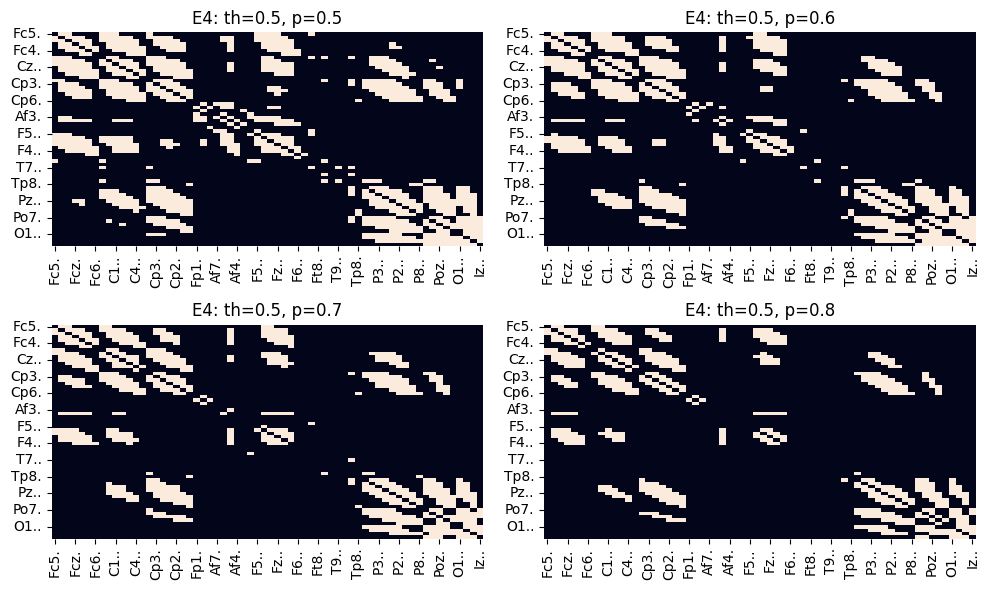

In [5]:
# Comparaciones de umbrales y porcentajes

# Ensayo 3: variar umbrales (fijar p=0.6)
e3_t02 = filtrar(ensayo3_dfs, 0.2, 0.6)
e3_t03 = filtrar(ensayo3_dfs, 0.3, 0.6)
e3_t05 = filtrar(ensayo3_dfs, 0.5, 0.6)
e3_t06 = filtrar(ensayo3_dfs, 0.6, 0.6)

fig, axes = plt.subplots(2, 2, figsize=(10, 6))
sns.heatmap(e3_t02, ax=axes[0, 0], cbar=False); axes[0, 0].set_title("E3: th=0.2, p=0.6")
sns.heatmap(e3_t03, ax=axes[0, 1], cbar=False); axes[0, 1].set_title("E3: th=0.3, p=0.6")
sns.heatmap(e3_t05, ax=axes[1, 0], cbar=False); axes[1, 0].set_title("E3: th=0.5, p=0.6")
sns.heatmap(e3_t06, ax=axes[1, 1], cbar=False); axes[1, 1].set_title("E3: th=0.6, p=0.6")
plt.tight_layout(); plt.show()

# Ensayo 4: variar porcentajes (fijar th=0.5 ≈ p75)
e4_p05 = filtrar(ensayo4_dfs, 0.5, 0.5)
e4_p06 = filtrar(ensayo4_dfs, 0.5, 0.6)
e4_p07 = filtrar(ensayo4_dfs, 0.5, 0.7)
e4_p08 = filtrar(ensayo4_dfs, 0.5, 0.8) 

fig, axes = plt.subplots(2, 2, figsize=(10, 6))
sns.heatmap(e4_p05, ax=axes[0, 0], cbar=False); axes[0, 0].set_title("E4: th=0.5, p=0.5")
sns.heatmap(e4_p06, ax=axes[0, 1], cbar=False); axes[0, 1].set_title("E4: th=0.5, p=0.6")
sns.heatmap(e4_p07, ax=axes[1, 0], cbar=False); axes[1, 0].set_title("E4: th=0.5, p=0.7")
sns.heatmap(e4_p08, ax=axes[1, 1], cbar=False); axes[1, 1].set_title("E4: th=0.5, p=0.8")

plt.tight_layout()
plt.show()

Ensayo 3 - Clustering: 0.7225087103196703 Hub: ('Afz.', 0.04249988936987842)
Ensayo 4 - Clustering: 0.45507008780156033 Hub: ('Cz..', 0.0417715810497214)


C:\Users\apgso\AppData\Local\Temp\ipykernel_27868\2750017342.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


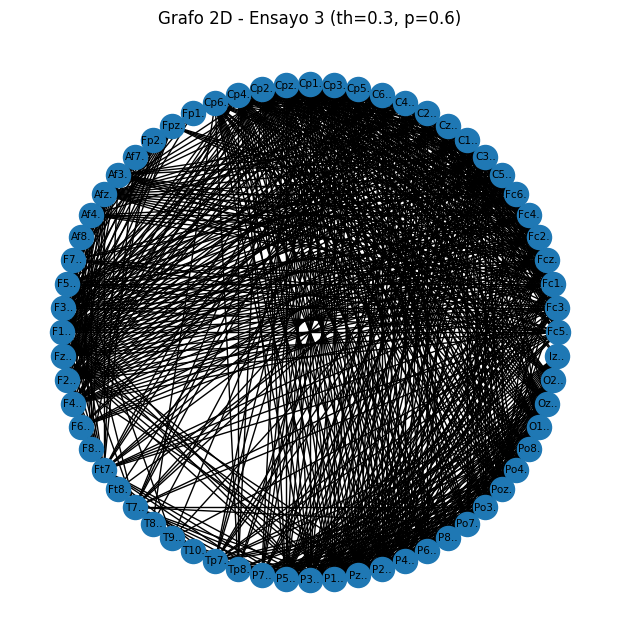

C:\Users\apgso\AppData\Local\Temp\ipykernel_27868\2750017342.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


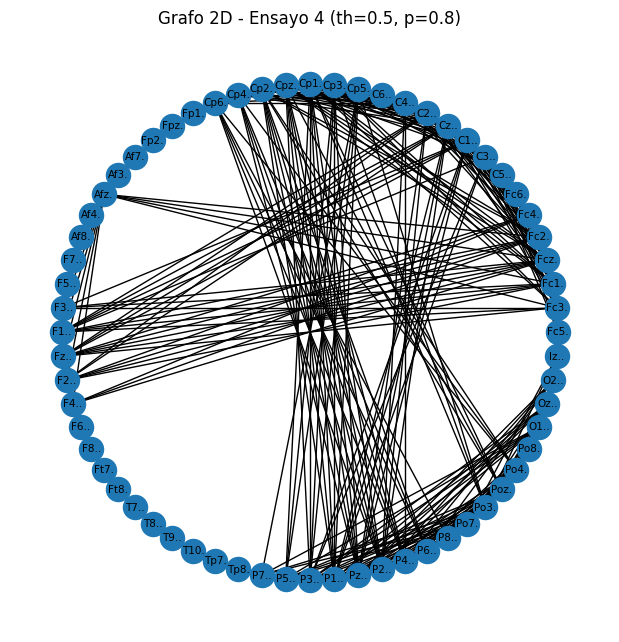

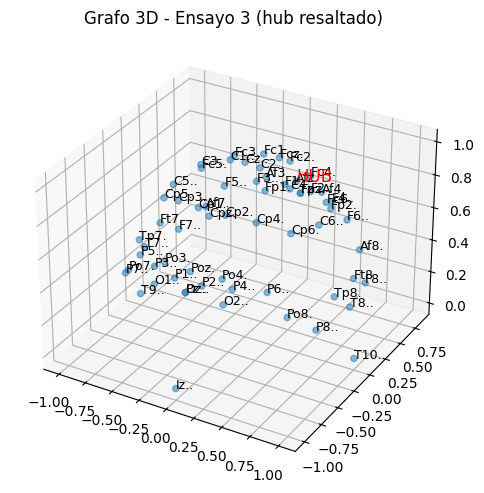

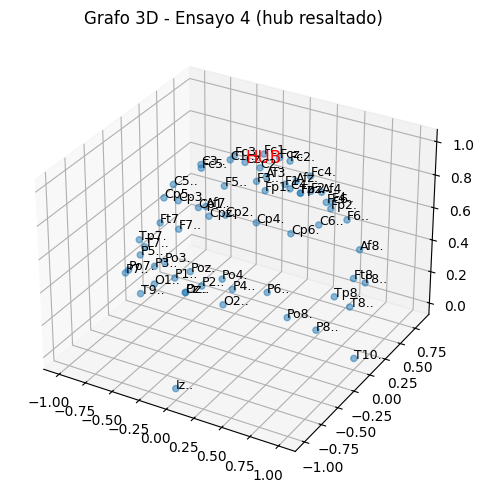

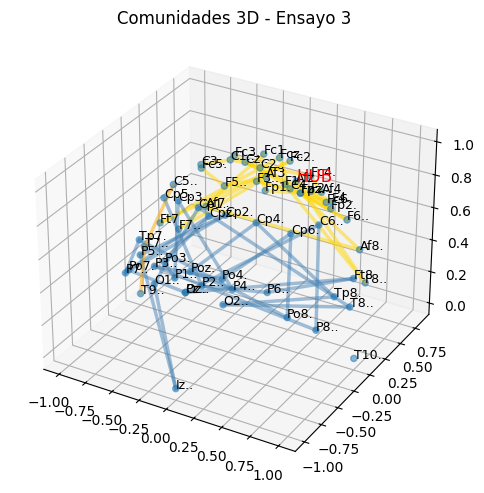

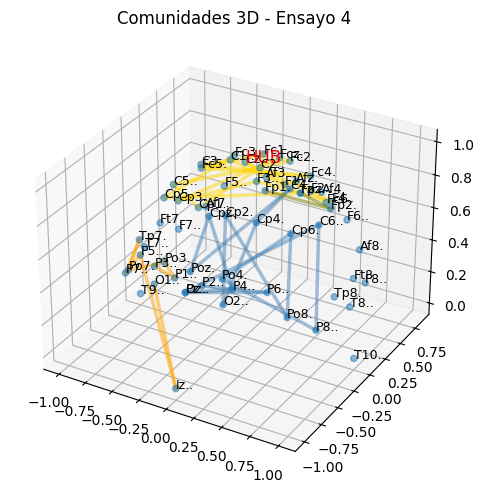

In [6]:
# Grafos 2D, hubs, grafos 3D y comunidades 3D

# Construir grafos finales con parámetros justificados
G3 = nx.from_pandas_adjacency(e3_t03)  # Ensayo 3: th=0.3, p=0.6
G4 = nx.from_pandas_adjacency(e4_p08)  # Ensayo 4: th=0.5, p=0.8

# Métricas básicas
clust3 = nx.average_clustering(G3)
clust4 = nx.average_clustering(G4)
# Centralidad de intermediación (betweenness)
bet3 = nx.betweenness_centrality(G3)
bet4 = nx.betweenness_centrality(G4)
# Hubs (nodos con mayor betweenness)
hub3 = sorted(bet3.items(), key=lambda x: x[1], reverse=True)[0]
hub4 = sorted(bet4.items(), key=lambda x: x[1], reverse=True)[0]
print("Ensayo 3 - Clustering:", clust3, "Hub:", hub3)
print("Ensayo 4 - Clustering:", clust4, "Hub:", hub4)

# Grafo 2D circular
plt.figure(figsize=(6, 6))
nx.draw_circular(G3, with_labels=True, font_size=7.5)
plt.title("Grafo 2D - Ensayo 3 (th=0.3, p=0.6)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6, 6))
nx.draw_circular(G4, with_labels=True, font_size=7.5)
plt.title("Grafo 2D - Ensayo 4 (th=0.5, p=0.8)")
plt.tight_layout(); plt.show()

# Grafo 3D con hub resaltado
def plot_3d_hub(hub, coords, titulo):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection="3d")
    x, y, z = coords["x"].values, coords["y"].values, coords["z"].values
    ax.scatter(x, y, z, alpha=0.5)
    for idx, (x_, y_, z_) in enumerate(zip(x, y, z)):
        etiqueta = coords.index[idx]
        ax.text(x_, y_, z_, etiqueta, fontsize=9)
        if etiqueta == hub[0]:
            ax.text(x_, y_, z_, "HUB", color="red", fontsize=12)
    plt.title(titulo)
    plt.tight_layout(); plt.show()

plot_3d_hub(hub3, coords, "Grafo 3D - Ensayo 3 (hub resaltado)")
plot_3d_hub(hub4, coords, "Grafo 3D - Ensayo 4 (hub resaltado)")

# Comunidades 3D (aristas coloreadas dentro de cada comunidad)
comunidades3 = nx.algorithms.community.greedy_modularity_communities(G3)
comunidades4 = nx.algorithms.community.greedy_modularity_communities(G4)

comunidades3 = nx.algorithms.community.greedy_modularity_communities(G3)
comunidades4 = nx.algorithms.community.greedy_modularity_communities(G4)

def plot_3d_comunidades(comunidades, hub, coords, titulo):
    fig = plt.figure(figsize=(6, 5))
    ax = fig.add_subplot(111, projection="3d")
    x, y, z = coords["x"].values, coords["y"].values, coords["z"].values
    ax.scatter(x, y, z, alpha=0.5)
    for idx, (x_, y_, z_) in enumerate(zip(x, y, z)):
        etiqueta = coords.index[idx]
        ax.text(x_, y_, z_, etiqueta, fontsize=9)
        if etiqueta == hub[0]:
            ax.text(x_, y_, z_, "HUB", color="red", fontsize=12)
    colores = ["gold", "steelblue", "orange", "olive", "crimson"]
    for i, comunidad in enumerate(comunidades):
        nodos = list(comunidad)
        for j in range(len(nodos)-1):
            n1, n2 = nodos[j], nodos[j+1]
            x_ = [coords.loc[n1, "x"], coords.loc[n2, "x"]]
            y_ = [coords.loc[n1, "y"], coords.loc[n2, "y"]]
            z_ = [coords.loc[n1, "z"], coords.loc[n2, "z"]]
            ax.plot(x_, y_, z_, linewidth=2.5, alpha=0.5, color=colores[i % len(colores)])
    plt.title(titulo)
    plt.tight_layout(); plt.show()

plot_3d_comunidades(comunidades3, hub3, coords, "Comunidades 3D - Ensayo 3")
plot_3d_comunidades(comunidades4, hub4, coords, "Comunidades 3D - Ensayo 4")

## Conclusiones

1. Umbrales: 0.3 (mediana) y 0.5 (p75) en ambos ensayos.
2. Consistencia poblacional: % 0.6 y 0.8 = robustez y reproducibilidad.
3. Ensayos 3 y 4 mostraron patrones de conectividad comparables entre tareas reales e imaginarias.
4. Heatmaps muestran variación en la densidad de conexiones según umbrales y %.
5. Grafos 2D/3D: evidencían hubs frontales (ej. Afz) como nodos integradores.
6. Estructura modular clara, agrupaciones fuertes de electrodos (comunidades).

# Código optimizado para los 14 ensayos del dataset

In [7]:
def procesar_ensayo(ruta_excel, nombre, coords):
    """
    Pipeline completo para un ensayo:
    - Calcula estadísticos y los grafica con nombres de ejes
    - Define thresholds automáticamente según mediana y p75
    - Ajusta porcentajes poblacionales según dispersión (MAD)
    - Filtra matrices y genera heatmaps y grafos 2D/3D
    """

    # Cargar datos
    ensayo_dict = pd.read_excel(ruta_excel, sheet_name=None, index_col=0)
    ensayo_dfs = [df for df in ensayo_dict.values()]

    # -------------------------
    # Estadísticos
    th25, th50, th75, medias, varianzas, mu_sigma = [], [], [], [], [], []
    fig, axes = plt.subplots(2, 2, figsize=(12, 7))

    for sujeto in ensayo_dfs:
        data = sujeto.stack().values
        th25.append(np.percentile(data, 25))
        th50.append(np.percentile(data, 50))
        th75.append(np.percentile(data, 75))
        medias.append(np.mean(data))
        varianzas.append(np.var(data))
        mu_sigma.append(np.mean(data) + np.var(data))

        sns.histplot(data, ax=axes[0, 0], kde=True)
        axes[0, 0].set_xlabel("Valor de conectividad")
        axes[0, 0].set_ylabel("Frecuencia")

        sns.ecdfplot(data, ax=axes[0, 1])
        axes[0, 1].set_xlabel("Valor de conectividad")
        axes[0, 1].set_ylabel("Proporción acumulada")

    axes[1, 0].plot(th25, label="P25")
    axes[1, 0].plot(th50, label="P50 (mediana)")
    axes[1, 0].plot(th75, label="P75")
    axes[1, 0].plot(medias, label="Media")
    axes[1, 0].plot(varianzas, label="Varianza")
    axes[1, 0].legend()
    axes[1, 0].set_title(f"{nombre}: evolución de estadísticos")
    axes[1, 0].set_xlabel("Sujetos")
    axes[1, 0].set_ylabel("Valor")
    axes[1, 1].axis("off")
    plt.tight_layout(); plt.show()

    estadisticos_df = pd.DataFrame(columns=['th25','th50','th75','media','mu_sigma'],
                                   index=['min','max','mediana','mad'])
    columnas = [th25, th50, th75, medias, mu_sigma]
    for idx, columna in enumerate(estadisticos_df.columns):
        estadisticos_df[columna] = [
            np.min(columnas[idx]),
            np.max(columnas[idx]),
            np.median(columnas[idx]),
            stats.median_abs_deviation(columnas[idx])
        ]
    print(f"Estadísticos globales {nombre}:\n", estadisticos_df)

    # -------------------------
    # Thresholds automáticos
    threshold_mediana = round(estadisticos_df.loc["mediana", "th50"], 2)
    threshold_p75     = round(estadisticos_df.loc["mediana", "th75"], 2)

    mad_val = estadisticos_df.loc["mad", "th50"]
    if mad_val < 0.08:
        poblacion_media, poblacion_alta = 0.7, 0.9
    else:
        poblacion_media, poblacion_alta = 0.6, 0.8

    print(f"{nombre} - Thresholds: mediana={threshold_mediana}, p75={threshold_p75}, "
          f"poblacion_media={poblacion_media}, poblacion_alta={poblacion_alta}")

    # -------------------------
    # Filtrado
    resultado_mediana = filtrar(ensayo_dfs, threshold_mediana, poblacion_media)
    resultado_p75     = filtrar(ensayo_dfs, threshold_p75, poblacion_alta)

    # Heatmaps
    plt.figure(figsize=(5, 3))
    sns.heatmap(resultado_mediana, cbar=False)
    plt.title(f"{nombre}: binaria (th={threshold_mediana}, p={poblacion_media})")
    plt.show()

    plt.figure(figsize=(5, 3))
    sns.heatmap(resultado_p75, cbar=False)
    plt.title(f"{nombre}: binaria (th={threshold_p75}, p={poblacion_alta})")
    plt.show()

    # -------------------------
    # Grafo final
    G = nx.from_pandas_adjacency(resultado_mediana)
    clust = nx.average_clustering(G)
    bet = nx.betweenness_centrality(G)
    hub = sorted(bet.items(), key=lambda x: x[1], reverse=True)[0]
    print(f"{nombre} - Clustering:", clust, "Hub:", hub)

    plt.figure(figsize=(6, 6))
    nx.draw_circular(G, with_labels=True, font_size=7.5)
    plt.title(f"Grafo 2D - {nombre}")
    plt.show()

    # -------------------------
    # Grafo 3D con HUB
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(coords["x"].values, coords["y"].values, coords["z"].values, alpha=0.6)
    for etiqueta in coords.index:
        ax.text(coords.loc[etiqueta, "x"], coords.loc[etiqueta, "y"], coords.loc[etiqueta, "z"], etiqueta, fontsize=8)
    if hub[0] in coords.index:
        ax.text(coords.loc[hub[0], "x"], coords.loc[hub[0], "y"], coords.loc[hub[0], "z"], "HUB", color="red", fontsize=12)
    ax.set_title(f"Grafo 3D - {nombre} (hub resaltado)")
    plt.tight_layout(); plt.show()

    # Comunidades 3D
    comunidades = nx.algorithms.community.greedy_modularity_communities(G)
    fig = plt.figure(figsize=(6, 5))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(coords["x"].values, coords["y"].values, coords["z"].values, alpha=0.6)
    for etiqueta in coords.index:
        ax.text(coords.loc[etiqueta, "x"], coords.loc[etiqueta, "y"], coords.loc[etiqueta, "z"], etiqueta, fontsize=8)
    if hub[0] in coords.index:
        ax.text(coords.loc[hub[0], "x"], coords.loc[hub[0], "y"], coords.loc[hub[0], "z"], "HUB", color="red", fontsize=12)
    colores = ["gold", "steelblue", "orange", "olive", "crimson", "purple", "teal"]
    for i, comunidad in enumerate(comunidades):
        nodos = list(comunidad)
        for u in nodos:
            for v in nodos:
                if u != v and G.has_edge(u, v):
                    x_ = [coords.loc[u, "x"], coords.loc[v, "x"]]
                    y_ = [coords.loc[u, "y"], coords.loc[v, "y"]]
                    z_ = [coords.loc[u, "z"], coords.loc[v, "z"]]
                    ax.plot(x_, y_, z_, linewidth=2.0, alpha=0.5, color=colores[i % len(colores)])
    ax.set_title(f"Comunidades 3D - {nombre}")
    plt.tight_layout(); plt.show()

    # -------------------------
    # Retorno
    return {
        "estadisticos": estadisticos_df,
        "threshold_mediana": threshold_mediana,
        "threshold_p75": threshold_p75,
        "poblacion_media": poblacion_media,
        "poblacion_alta": poblacion_alta,
        "resultado_mediana": resultado_mediana,
        "resultado_p75": resultado_p75,
        "grafo": G,
        "hub": hub,
        "comunidades": comunidades
    }

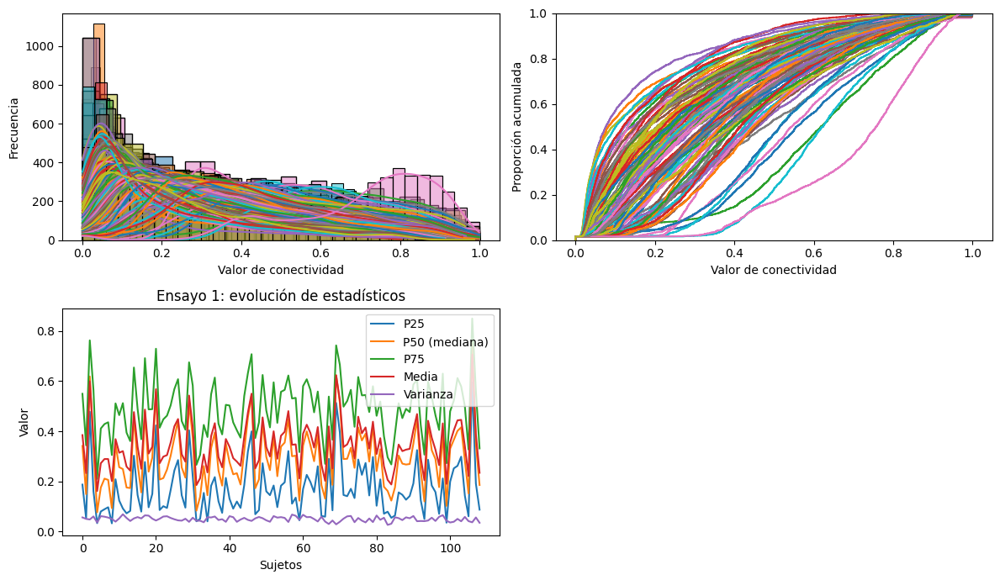

Estadísticos globales Ensayo 1:
              th25      th50      th75     media  mu_sigma
min      0.032697  0.076714  0.209912  0.161561  0.197553
max      0.595143  0.756905  0.849652  0.706086  0.742915
mediana  0.145722  0.289201  0.489698  0.338026  0.389710
mad      0.062204  0.083322  0.075572  0.065580  0.064114
Ensayo 1 - Thresholds: mediana=0.29, p75=0.49, poblacion_media=0.6, poblacion_alta=0.8


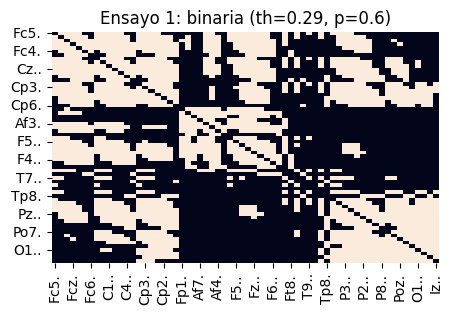

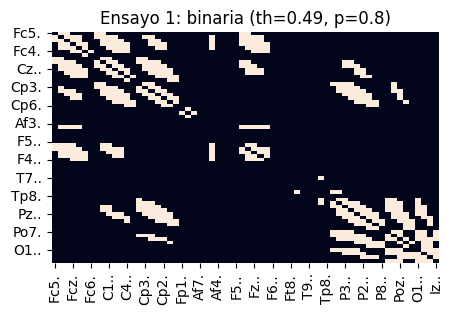

Ensayo 1 - Clustering: 0.7329860604289634 Hub: ('Afz.', 0.03696294128193113)


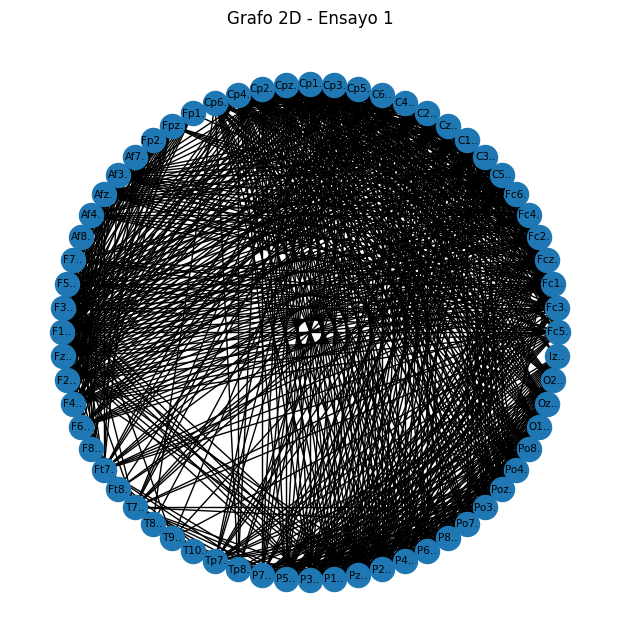

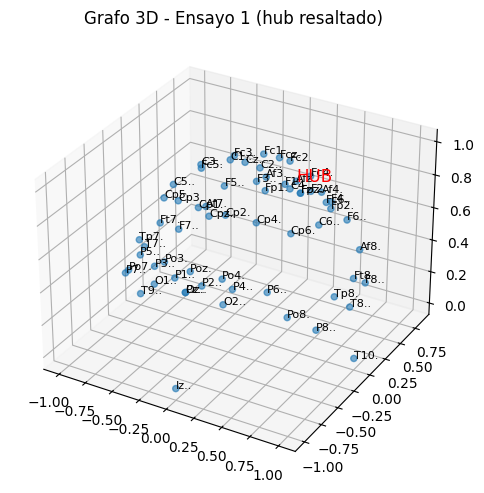

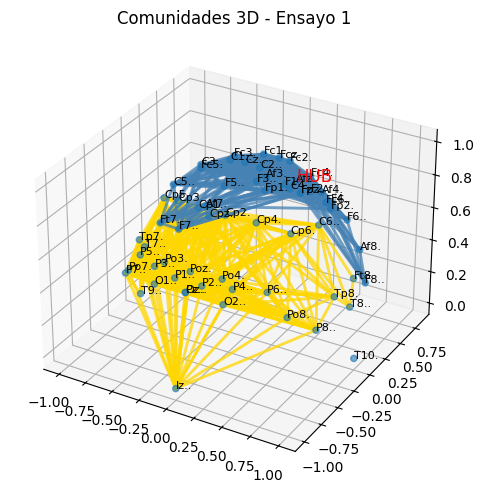

{'estadisticos':              th25      th50      th75     media  mu_sigma
 min      0.032697  0.076714  0.209912  0.161561  0.197553
 max      0.595143  0.756905  0.849652  0.706086  0.742915
 mediana  0.145722  0.289201  0.489698  0.338026  0.389710
 mad      0.062204  0.083322  0.075572  0.065580  0.064114,
 'threshold_mediana': np.float64(0.29),
 'threshold_p75': np.float64(0.49),
 'poblacion_media': 0.6,
 'poblacion_alta': 0.8,
 'resultado_mediana':        Fc5.   Fc3.   Fc1.   Fcz.   Fc2.   Fc4.   Fc6.   C5..   C3..   C1..  \
 Fc5.  False   True   True   True   True  False  False   True   True   True   
 Fc3.   True  False   True   True   True   True  False   True   True   True   
 Fc1.   True   True  False   True   True   True   True   True   True   True   
 Fcz.   True   True   True  False   True   True   True   True   True   True   
 Fc2.   True   True   True   True  False   True   True   True   True   True   
 ...     ...    ...    ...    ...    ...    ...    ...    ...    ...

In [8]:
# Ejemplo de aplicación:
# Ruta ensayo 1
ruta_ensayo1 = r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_01.xlsx"
# Aplicar función
procesar_ensayo(ruta_ensayo1, "Ensayo 1", coords)

### Loop para los 14 ensayos


================ Procesando Ensayo 1 ================



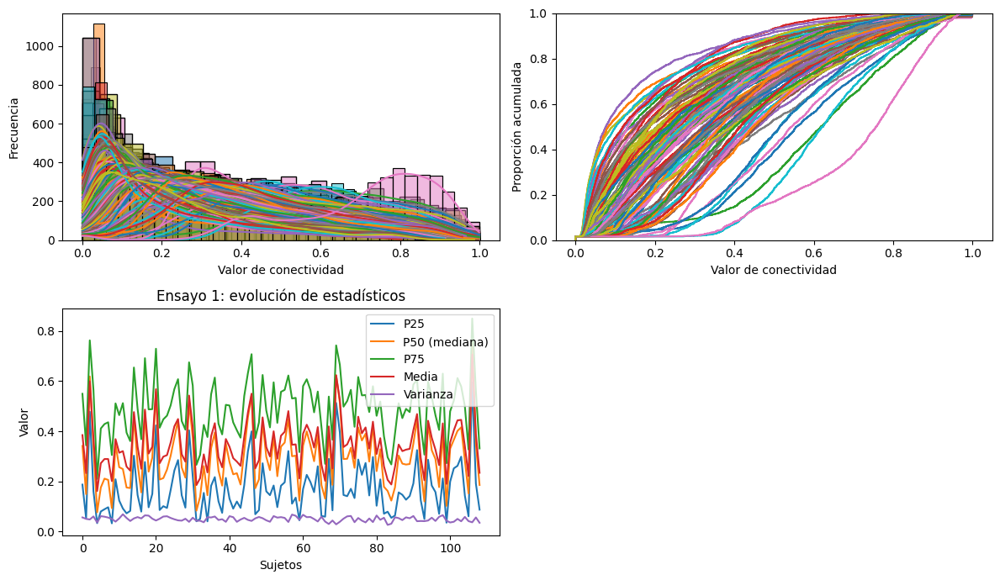

Estadísticos globales Ensayo 1:
              th25      th50      th75     media  mu_sigma
min      0.032697  0.076714  0.209912  0.161561  0.197553
max      0.595143  0.756905  0.849652  0.706086  0.742915
mediana  0.145722  0.289201  0.489698  0.338026  0.389710
mad      0.062204  0.083322  0.075572  0.065580  0.064114
Ensayo 1 - Thresholds: mediana=0.29, p75=0.49, poblacion_media=0.6, poblacion_alta=0.8


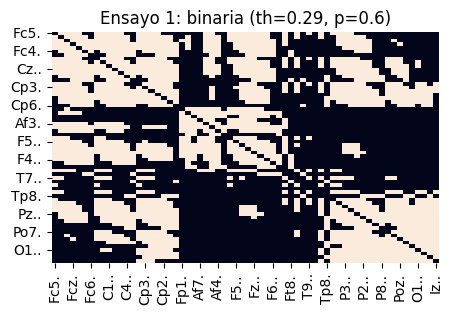

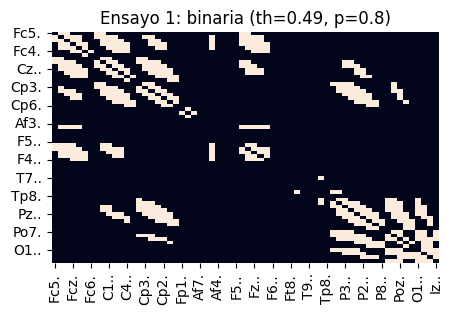

Ensayo 1 - Clustering: 0.7329860604289634 Hub: ('Afz.', 0.03696294128193113)


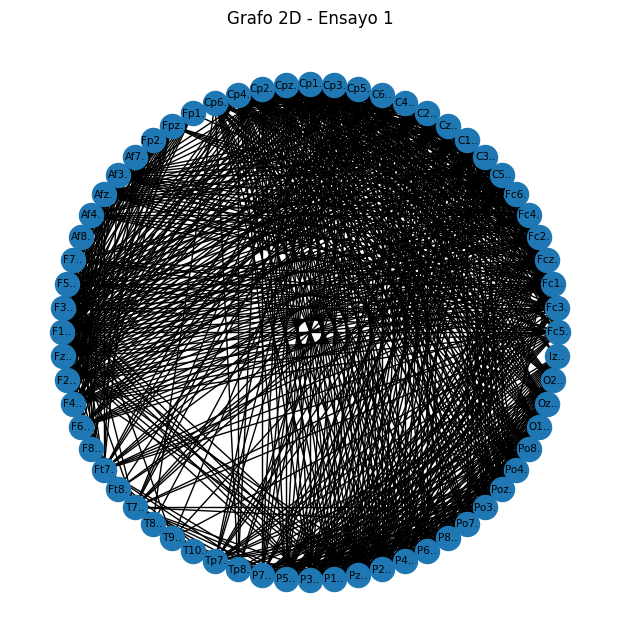

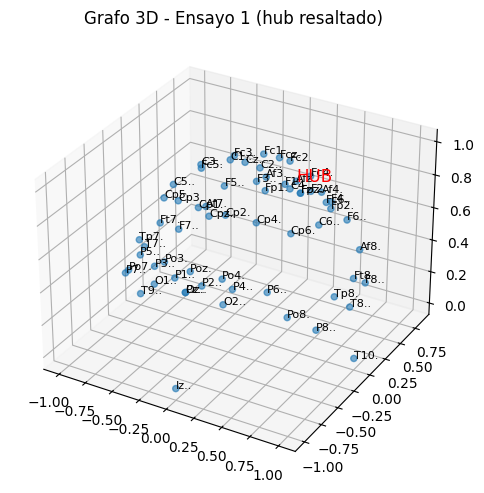

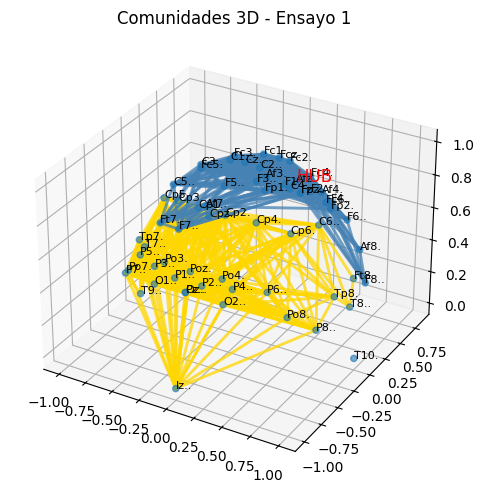


================ Procesando Ensayo 2 ================



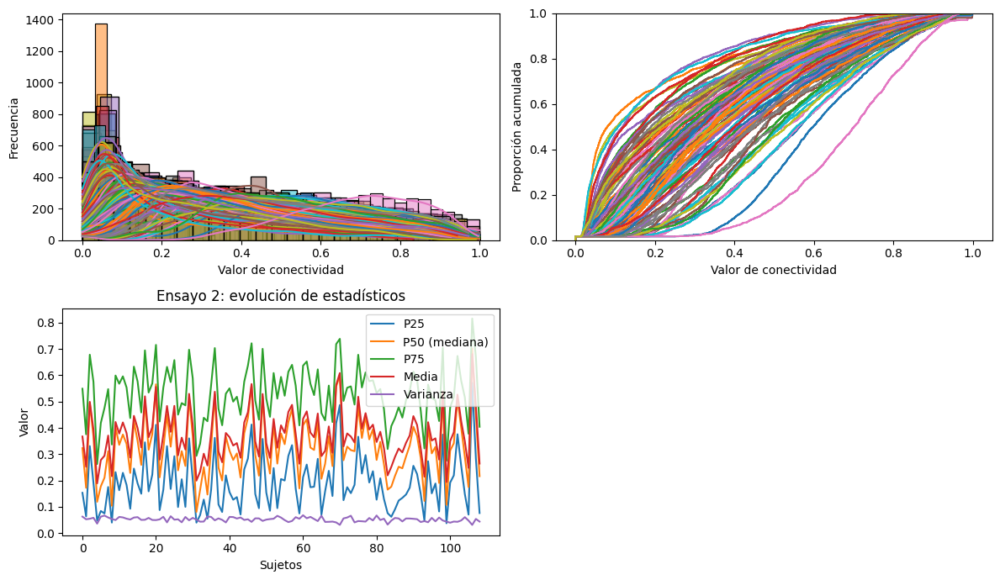

Estadísticos globales Ensayo 2:
              th25      th50      th75     media  mu_sigma
min      0.037791  0.080802  0.262778  0.189245  0.225512
max      0.571531  0.701782  0.815529  0.680436  0.711873
mediana  0.172704  0.323120  0.541864  0.370818  0.427566
mad      0.069793  0.076621  0.069565  0.060242  0.062651
Ensayo 2 - Thresholds: mediana=0.32, p75=0.54, poblacion_media=0.7, poblacion_alta=0.9


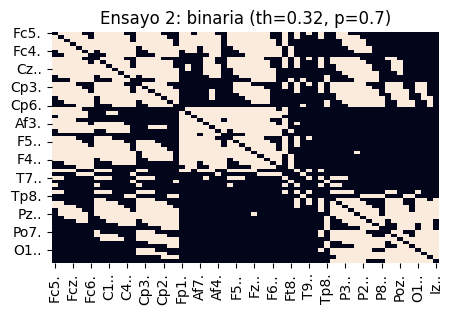

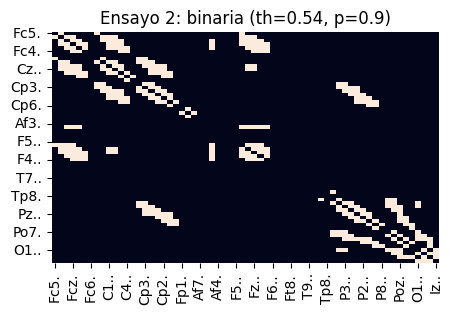

Ensayo 2 - Clustering: 0.7173873038437361 Hub: ('Cp1.', 0.03576287186654445)


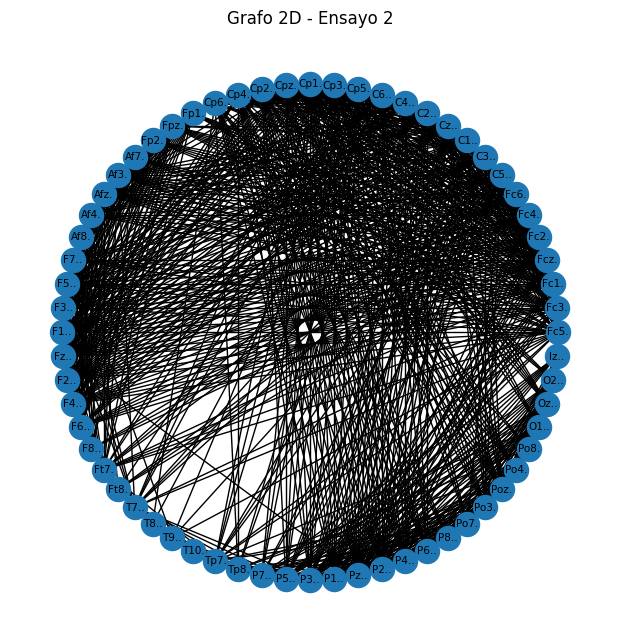

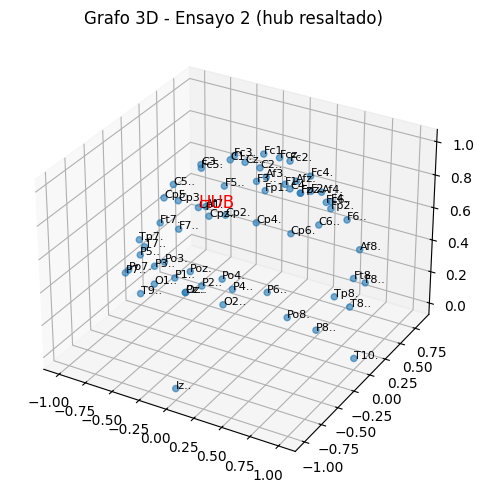

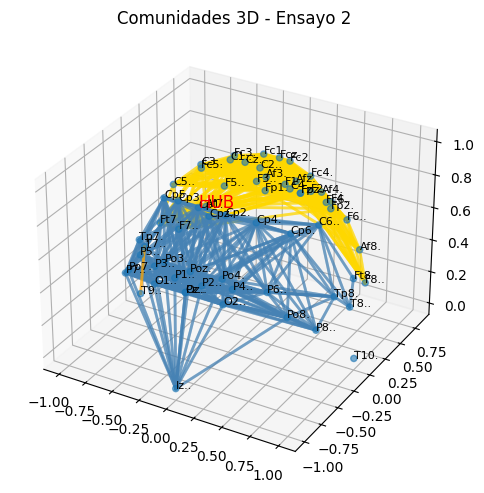


================ Procesando Ensayo 3 ================



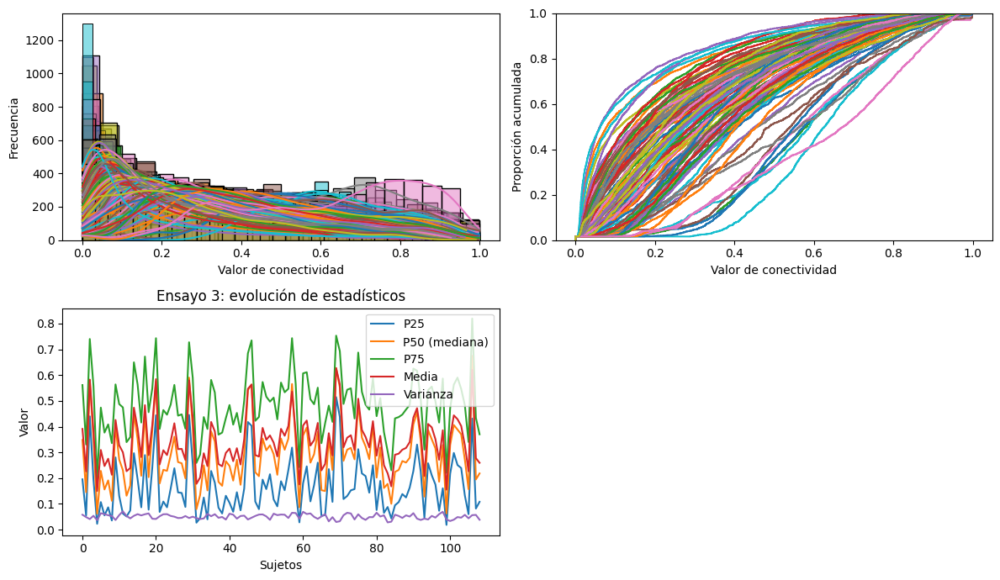

Estadísticos globales Ensayo 3:
              th25      th50      th75     media  mu_sigma
min      0.018413  0.061750  0.196867  0.149821  0.186222
max      0.514472  0.674805  0.819681  0.626848  0.676548
mediana  0.144574  0.273808  0.484181  0.327700  0.389466
mad      0.069559  0.080172  0.074567  0.063494  0.060276
Ensayo 3 - Thresholds: mediana=0.27, p75=0.48, poblacion_media=0.6, poblacion_alta=0.8


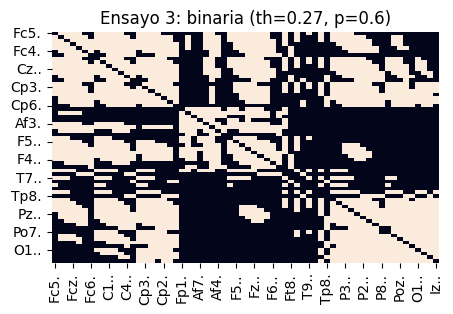

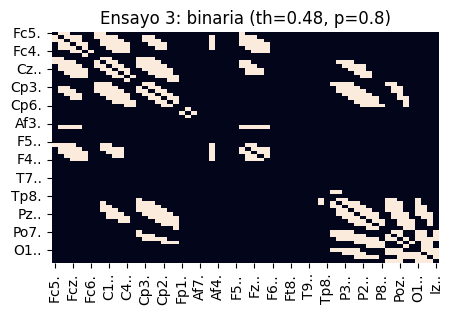

Ensayo 3 - Clustering: 0.7472362706695099 Hub: ('Afz.', 0.03914299404624845)


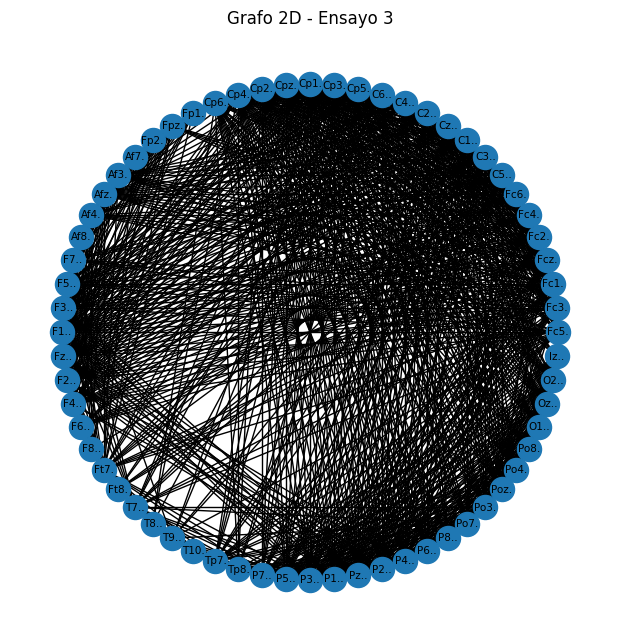

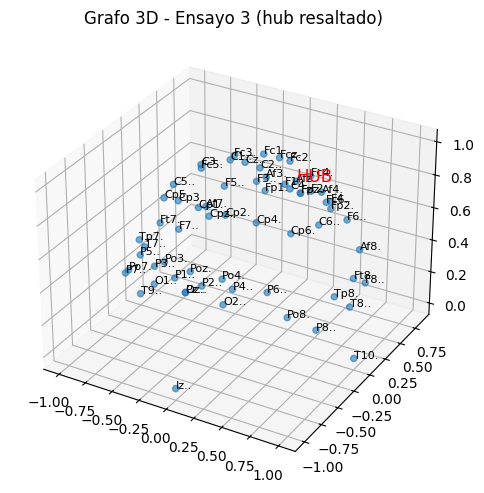

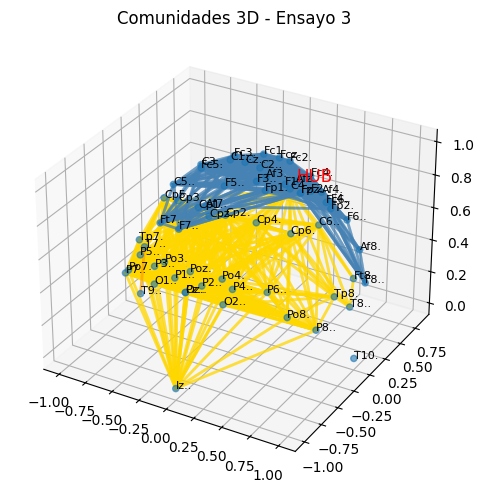


================ Procesando Ensayo 4 ================



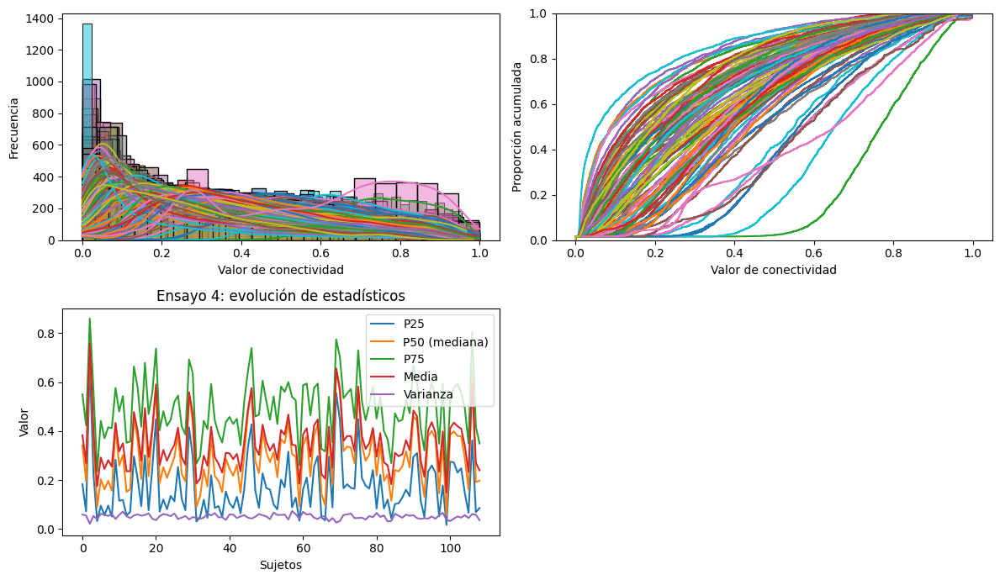

Estadísticos globales Ensayo 4:
              th25      th50      th75     media  mu_sigma
min      0.016915  0.055561  0.210152  0.148728  0.186648
max      0.680820  0.768026  0.859416  0.758803  0.780441
mediana  0.135265  0.288254  0.480688  0.333706  0.384217
mad      0.066142  0.090804  0.077428  0.068714  0.067877
Ensayo 4 - Thresholds: mediana=0.29, p75=0.48, poblacion_media=0.6, poblacion_alta=0.8


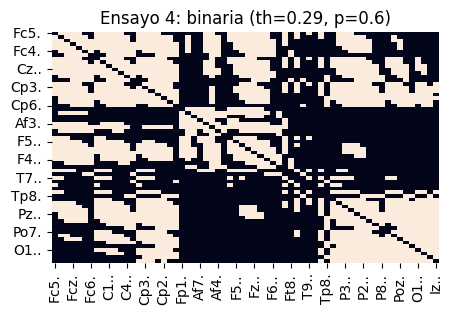

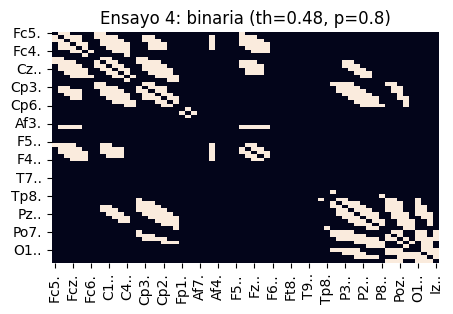

Ensayo 4 - Clustering: 0.7339891662914458 Hub: ('Afz.', 0.04858420977275826)


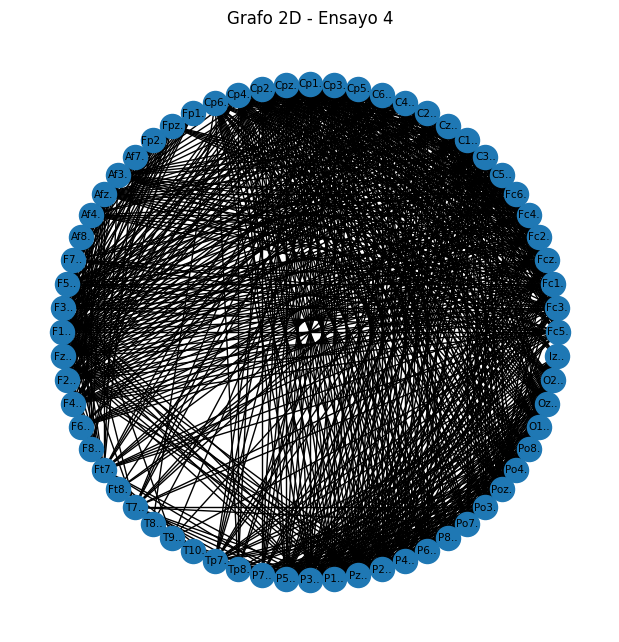

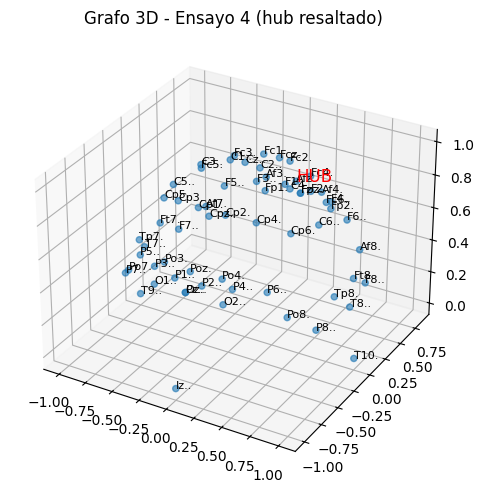

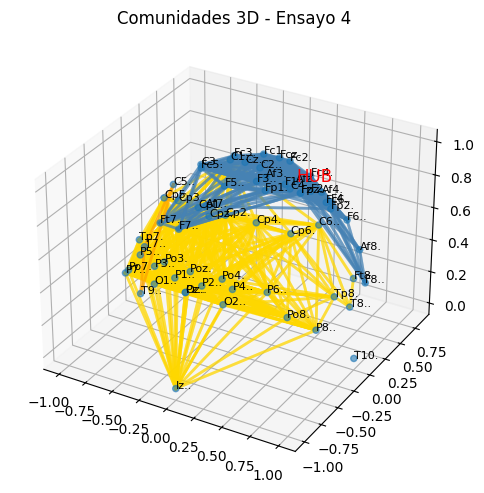


================ Procesando Ensayo 5 ================



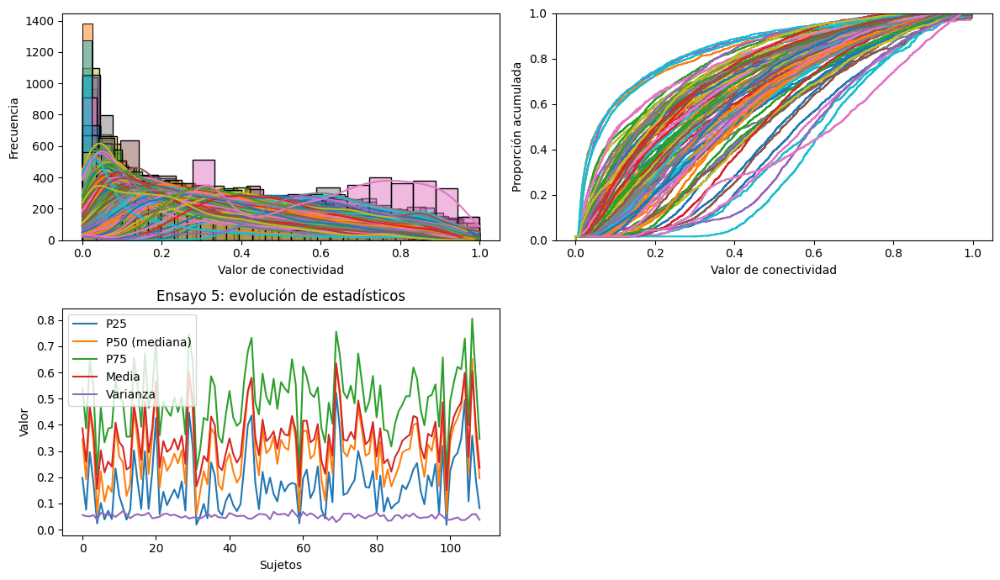

Estadísticos globales Ensayo 5:
              th25      th50      th75     media  mu_sigma
min      0.017846  0.057751  0.205711  0.149197  0.187056
max      0.522739  0.651729  0.805549  0.634132  0.662407
mediana  0.152787  0.293580  0.500263  0.345151  0.399663
mad      0.070700  0.086319  0.075435  0.066217  0.066465
Ensayo 5 - Thresholds: mediana=0.29, p75=0.5, poblacion_media=0.6, poblacion_alta=0.8


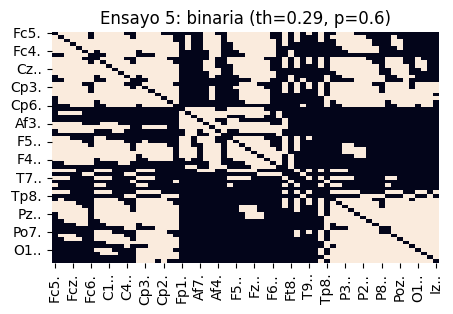

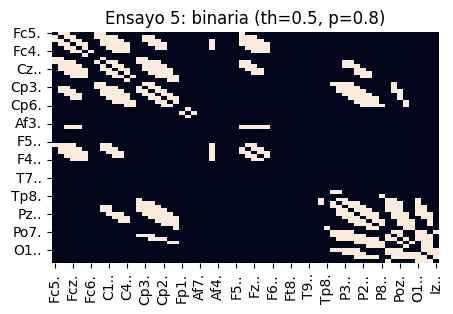

Ensayo 5 - Clustering: 0.7392517531582183 Hub: ('Afz.', 0.043302444227641367)


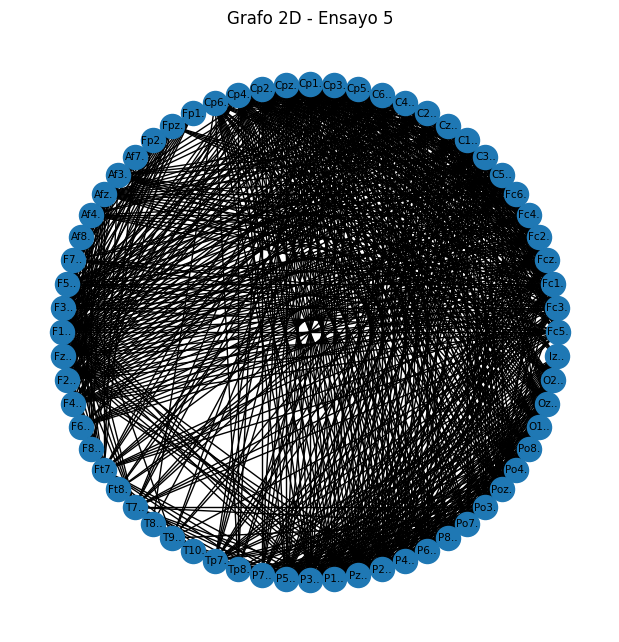

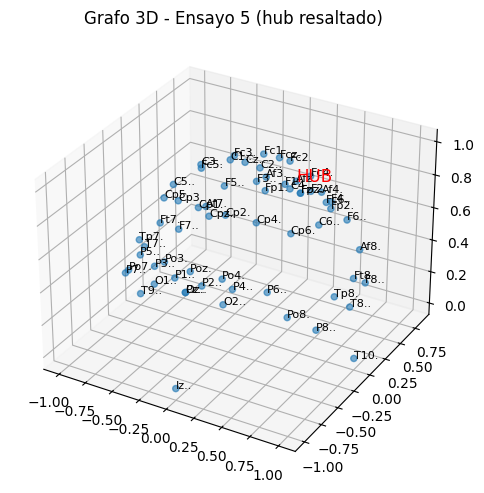

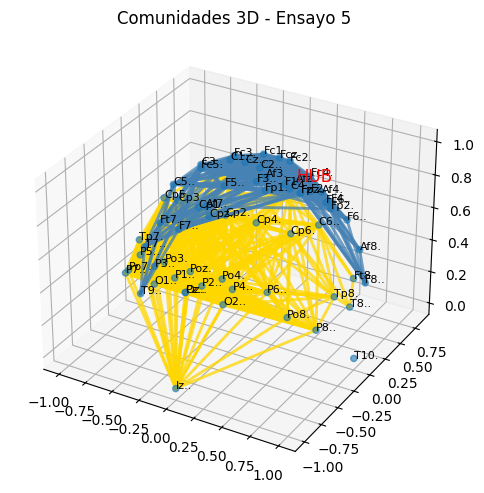


================ Procesando Ensayo 6 ================



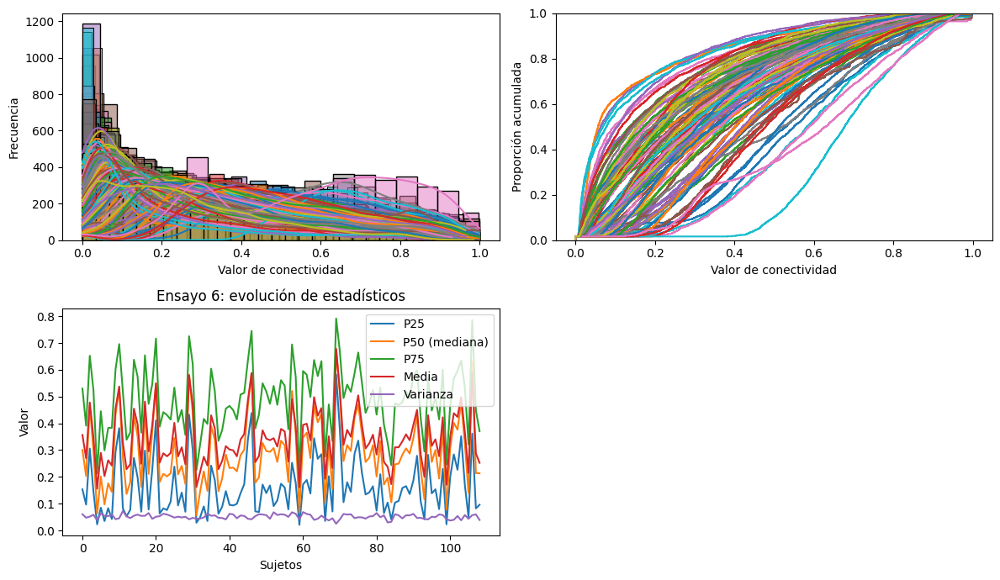

Estadísticos globales Ensayo 6:
              th25      th50      th75     media  mu_sigma
min      0.020813  0.056888  0.212805  0.155611  0.193690
max      0.581896  0.677777  0.791389  0.677028  0.702156
mediana  0.141362  0.283153  0.491666  0.336762  0.389167
mad      0.063058  0.081983  0.083793  0.061957  0.071221
Ensayo 6 - Thresholds: mediana=0.28, p75=0.49, poblacion_media=0.6, poblacion_alta=0.8


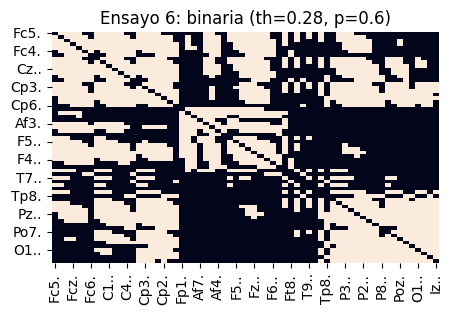

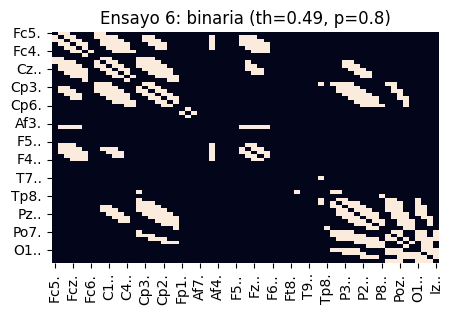

Ensayo 6 - Clustering: 0.7356143450127097 Hub: ('Afz.', 0.040808472640502406)


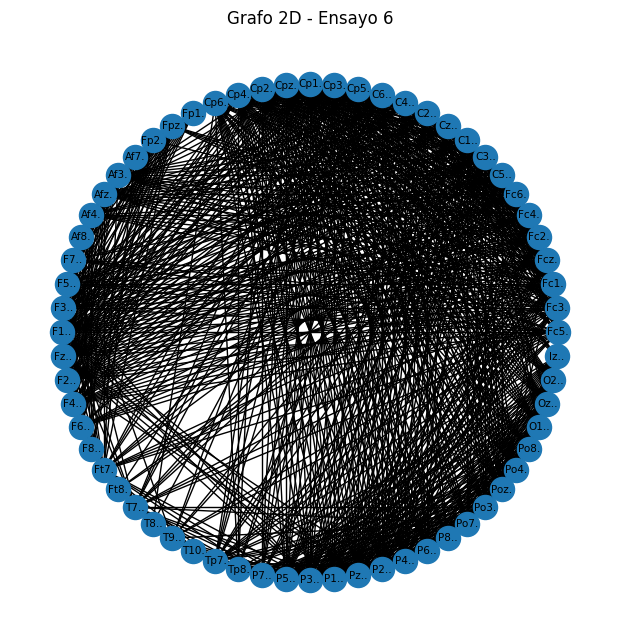

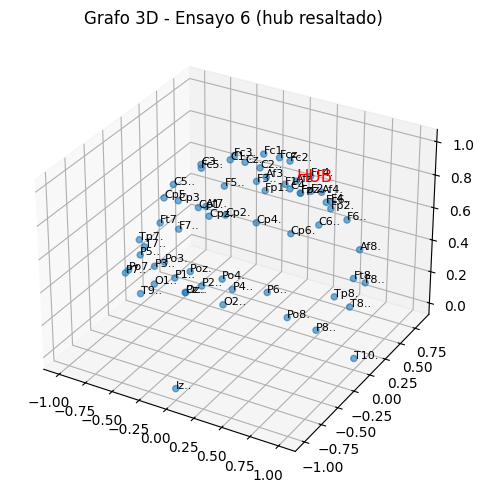

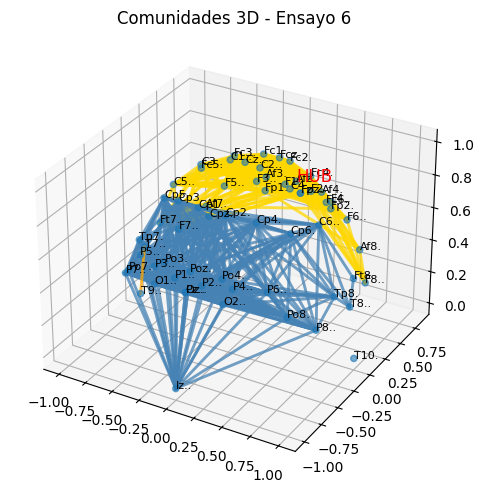


================ Procesando Ensayo 7 ================



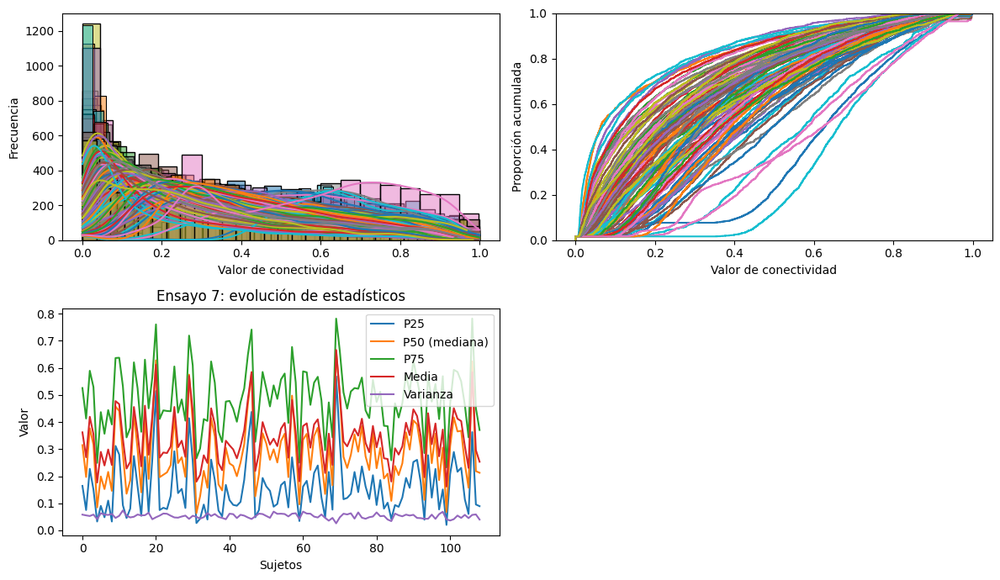

Estadísticos globales Ensayo 7:
              th25      th50      th75     media  mu_sigma
min      0.020165  0.063588  0.232377  0.161680  0.202339
max      0.568339  0.662815  0.782179  0.666225  0.692207
mediana  0.134889  0.271477  0.477983  0.328287  0.379224
mad      0.058291  0.076475  0.076891  0.062216  0.061641
Ensayo 7 - Thresholds: mediana=0.27, p75=0.48, poblacion_media=0.7, poblacion_alta=0.9


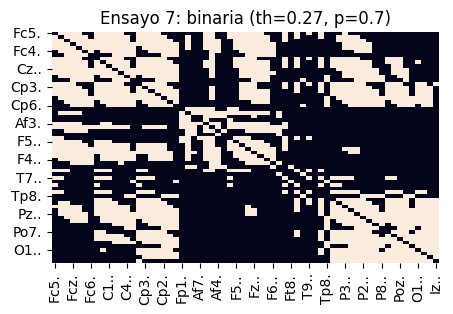

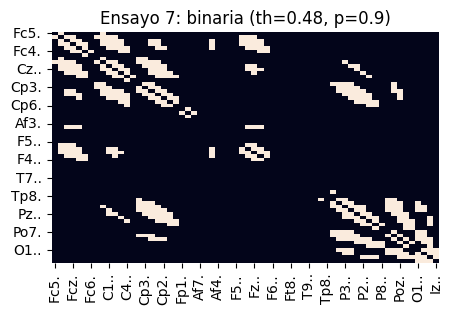

Ensayo 7 - Clustering: 0.7045870026374019 Hub: ('Afz.', 0.06322004482564238)


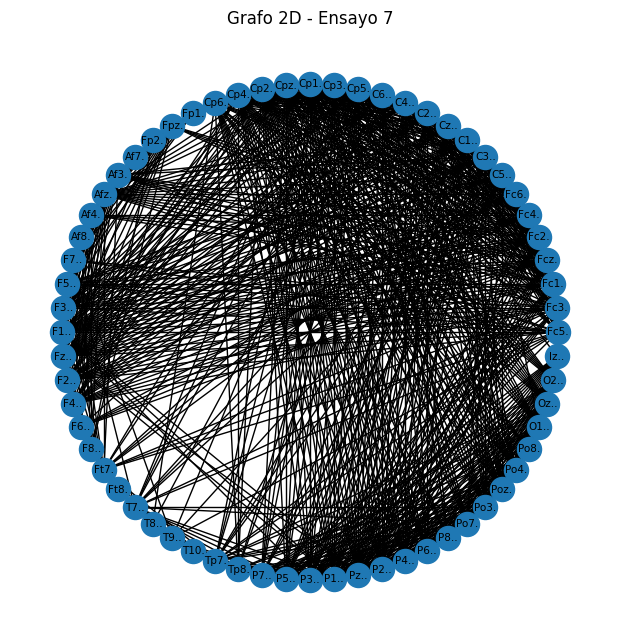

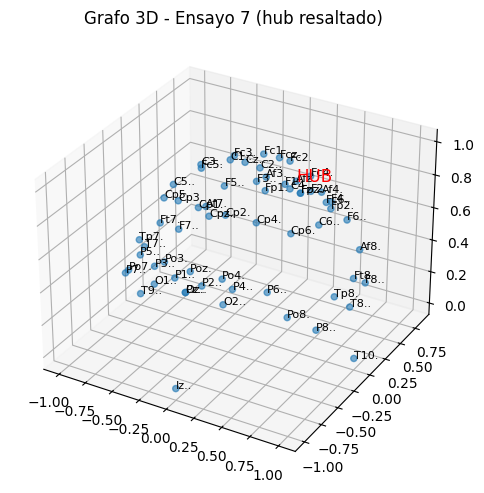

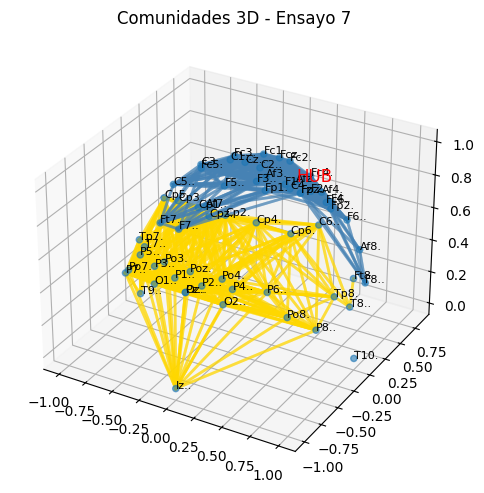


================ Procesando Ensayo 8 ================



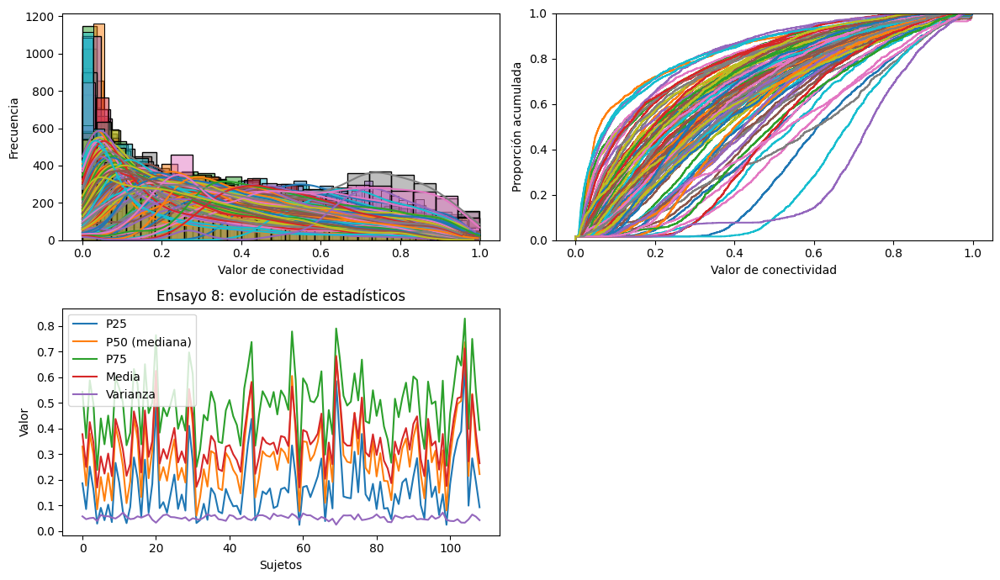

Estadísticos globales Ensayo 8:
              th25      th50      th75     media  mu_sigma
min      0.024159  0.060146  0.233367  0.169819  0.209022
max      0.655911  0.736756  0.829220  0.712739  0.745434
mediana  0.143733  0.289856  0.499248  0.338221  0.395569
mad      0.057266  0.075599  0.079820  0.063424  0.065362
Ensayo 8 - Thresholds: mediana=0.29, p75=0.5, poblacion_media=0.7, poblacion_alta=0.9


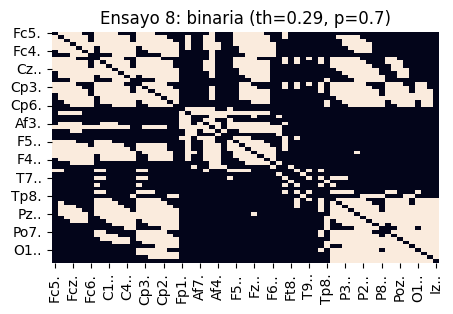

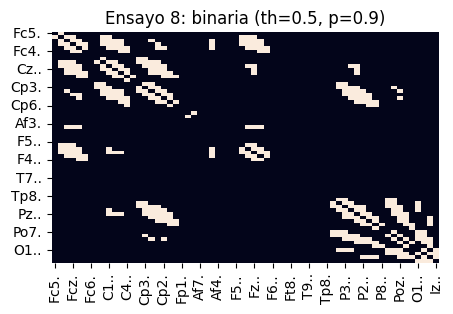

Ensayo 8 - Clustering: 0.6919555364837655 Hub: ('Afz.', 0.09791126838931462)


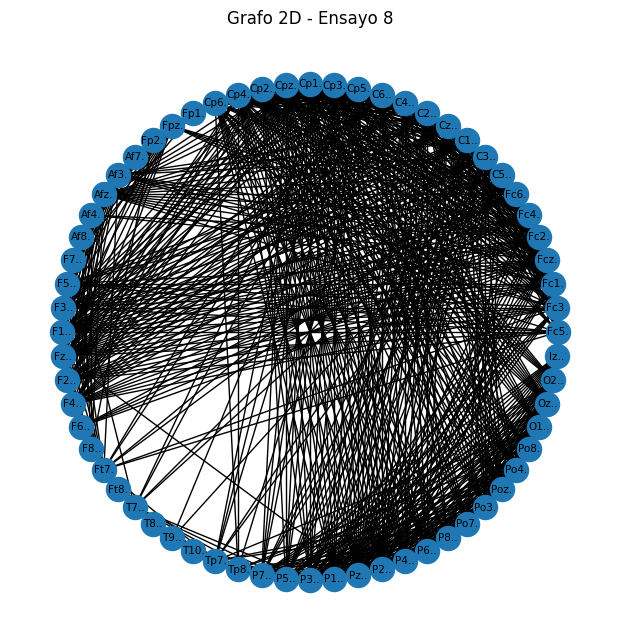

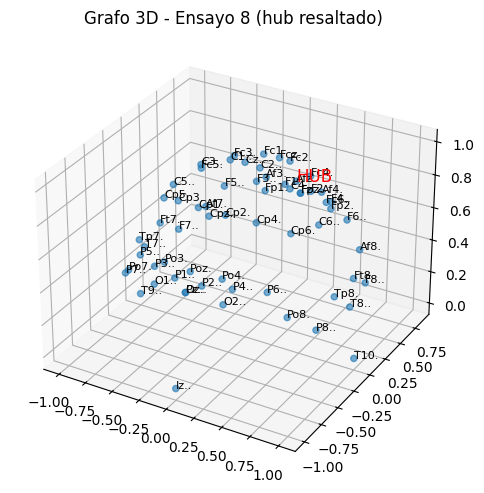

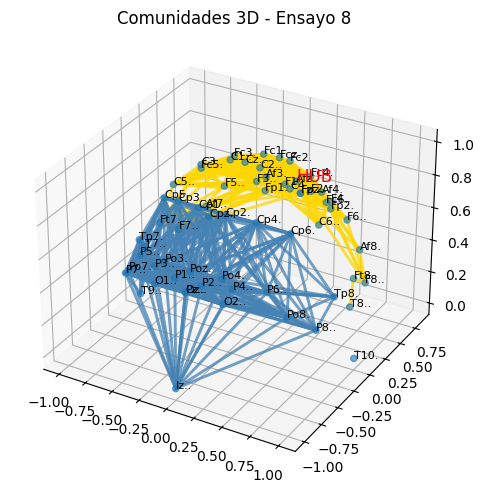


================ Procesando Ensayo 9 ================



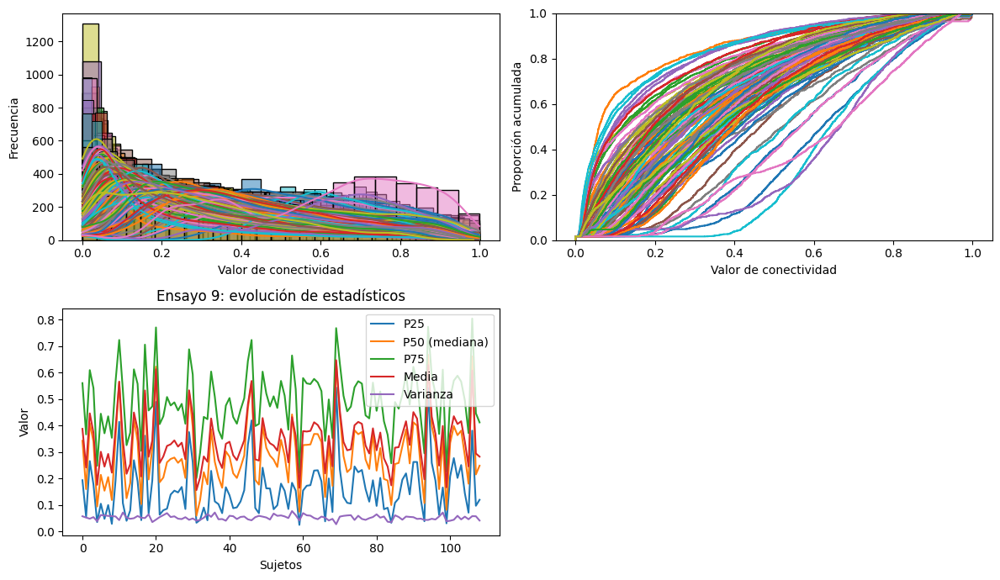

Estadísticos globales Ensayo 9:
              th25      th50      th75     media  mu_sigma
min      0.025133  0.059913  0.201505  0.156606  0.197713
max      0.544094  0.668016  0.804748  0.647440  0.675088
mediana  0.147738  0.282581  0.495434  0.338671  0.393081
mad      0.060958  0.081538  0.071127  0.062873  0.061658
Ensayo 9 - Thresholds: mediana=0.28, p75=0.5, poblacion_media=0.6, poblacion_alta=0.8


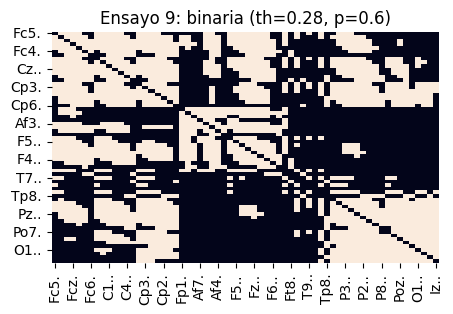

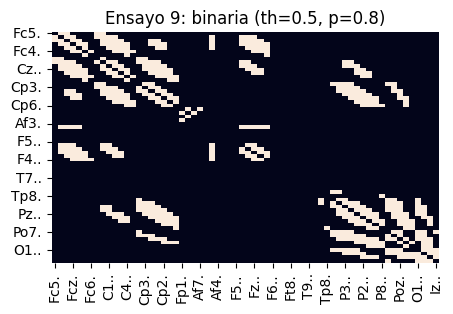

Ensayo 9 - Clustering: 0.7366909284148435 Hub: ('Afz.', 0.03824572565292943)


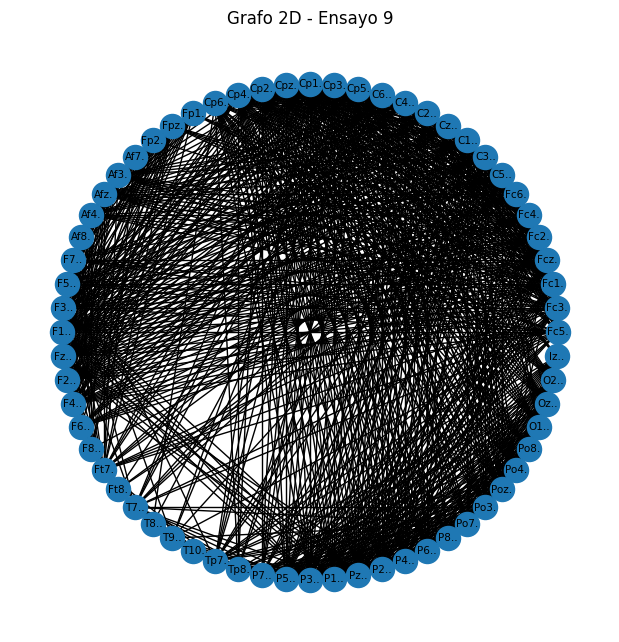

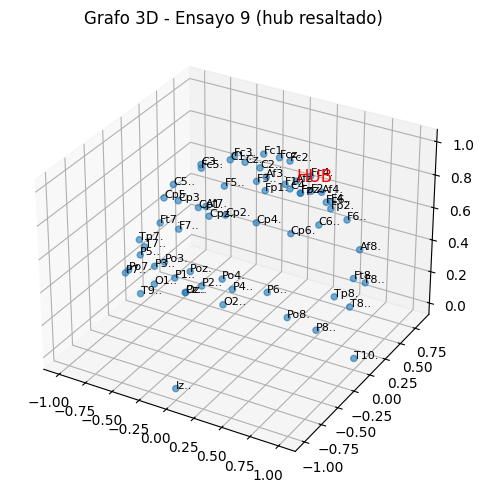

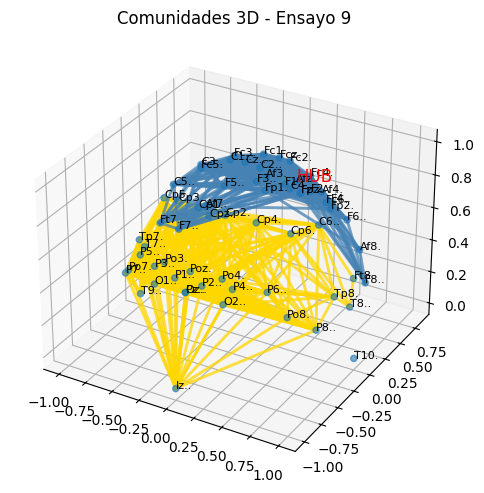


================ Procesando Ensayo 10 ================



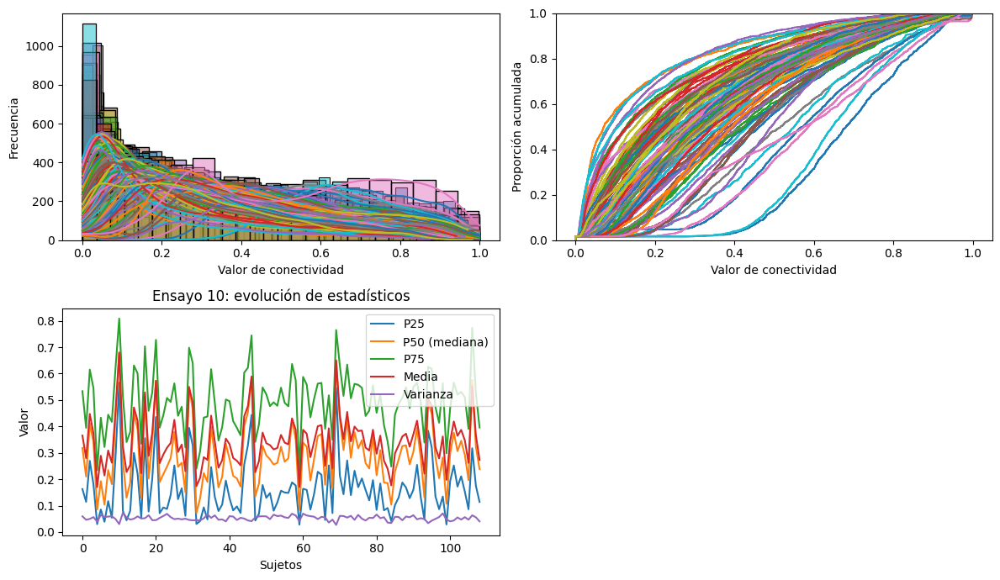

Estadísticos globales Ensayo 10:
              th25      th50      th75     media  mu_sigma
min      0.028055  0.071405  0.228713  0.169990  0.209270
max      0.565897  0.681570  0.808697  0.678228  0.708223
mediana  0.143204  0.281213  0.495776  0.336986  0.394345
mad      0.059762  0.078734  0.067763  0.057167  0.055556
Ensayo 10 - Thresholds: mediana=0.28, p75=0.5, poblacion_media=0.7, poblacion_alta=0.9


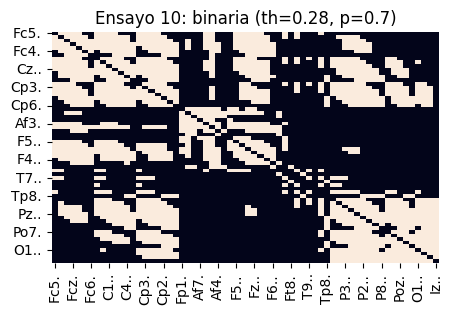

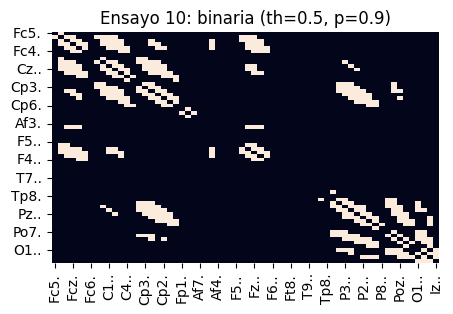

Ensayo 10 - Clustering: 0.700910121367564 Hub: ('Afz.', 0.08561199270108005)


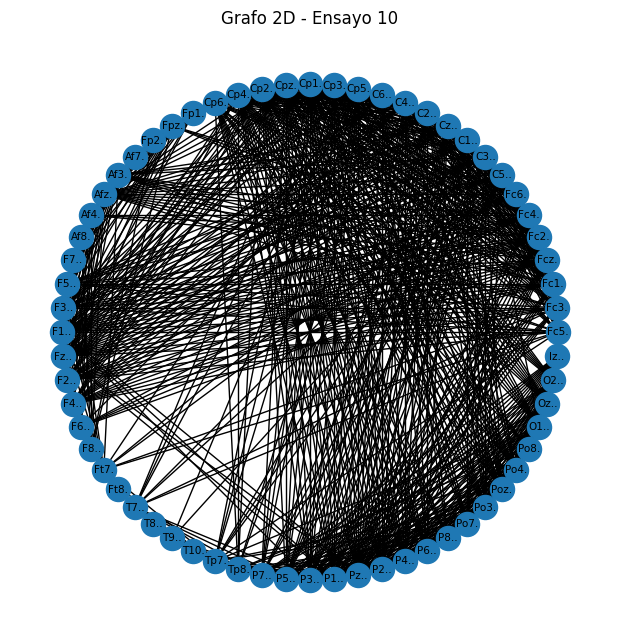

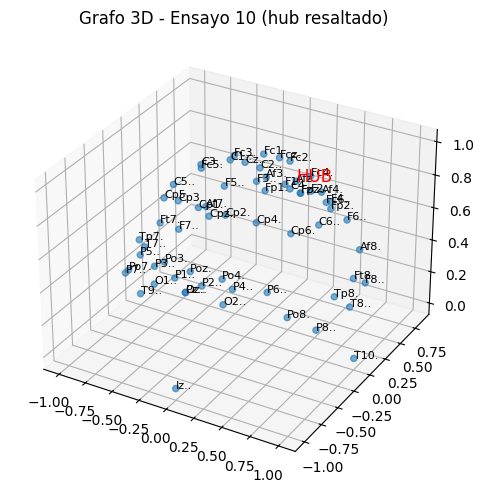

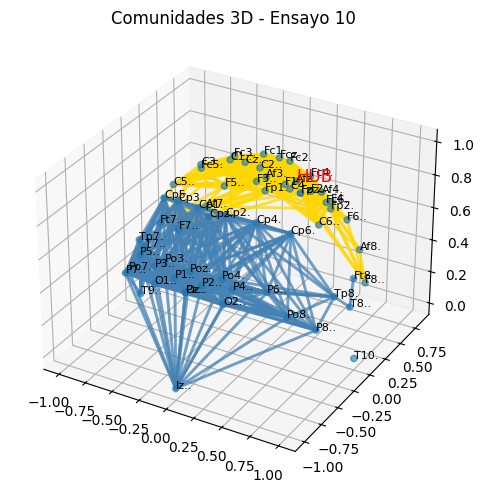


================ Procesando Ensayo 11 ================



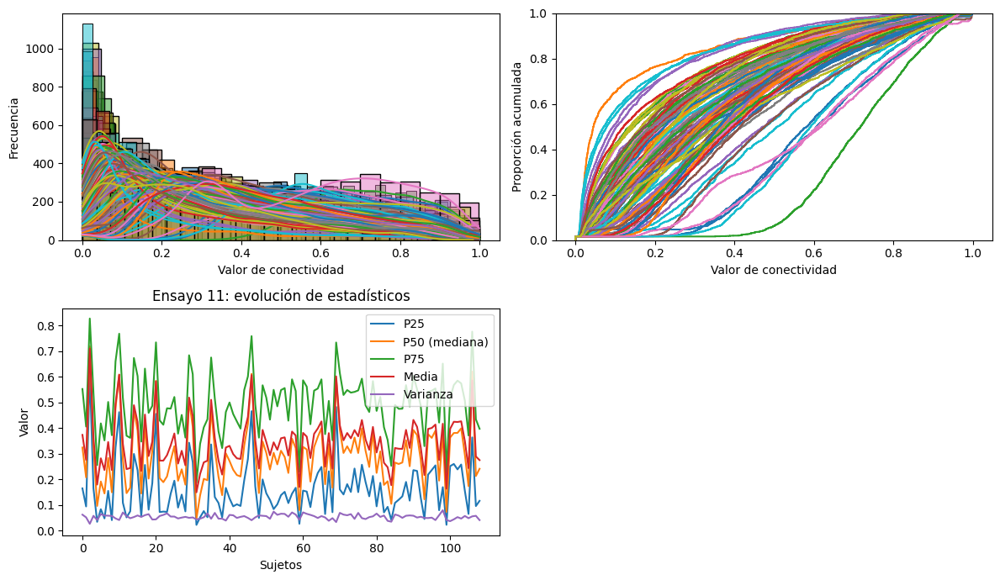

Estadísticos globales Ensayo 11:
              th25      th50      th75     media  mu_sigma
min      0.021555  0.045460  0.185392  0.148617  0.191542
max      0.615154  0.718014  0.826435  0.709377  0.735145
mediana  0.143303  0.300624  0.501028  0.344628  0.402096
mad      0.062306  0.084665  0.072910  0.063289  0.059084
Ensayo 11 - Thresholds: mediana=0.3, p75=0.5, poblacion_media=0.6, poblacion_alta=0.8


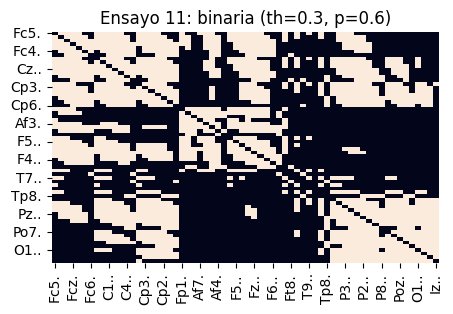

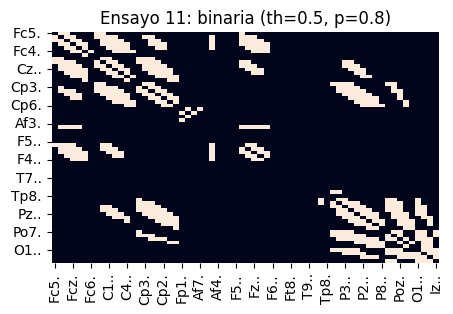

Ensayo 11 - Clustering: 0.7242510843013286 Hub: ('C6..', 0.03157151790603297)


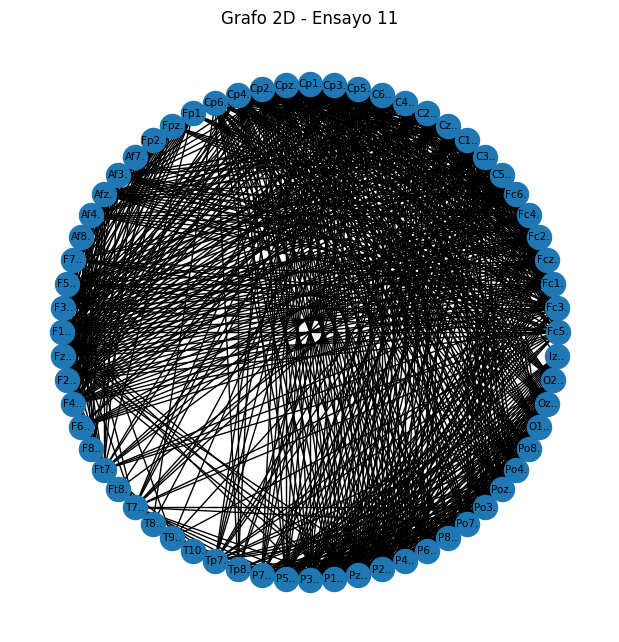

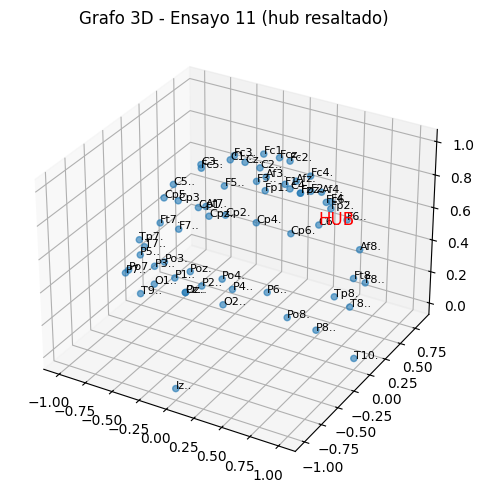

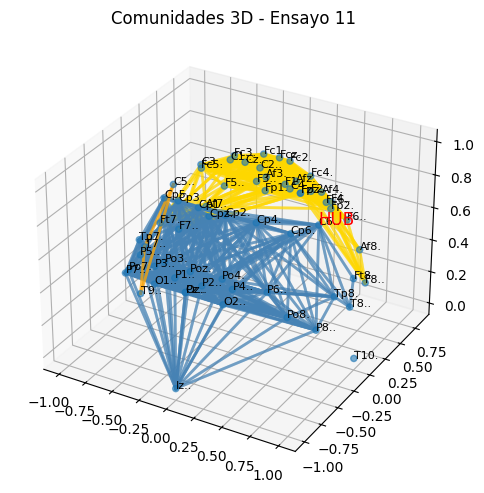


================ Procesando Ensayo 12 ================



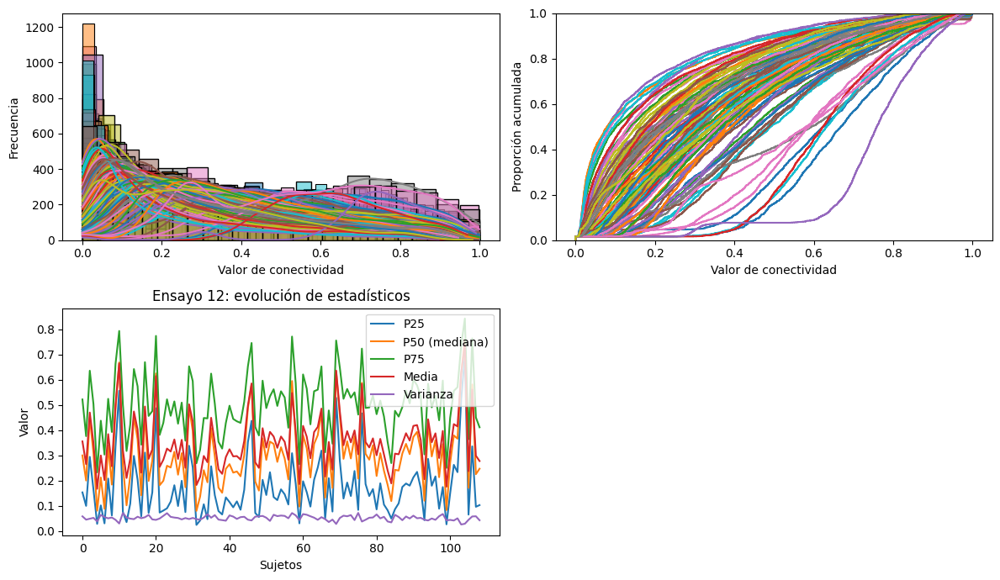

Estadísticos globales Ensayo 12:
              th25      th50      th75     media  mu_sigma
min      0.025070  0.080545  0.233336  0.167928  0.206752
max      0.694826  0.758708  0.842632  0.738661  0.768245
mediana  0.146144  0.288248  0.502249  0.349940  0.398904
mad      0.062501  0.078347  0.072950  0.063301  0.061011
Ensayo 12 - Thresholds: mediana=0.29, p75=0.5, poblacion_media=0.7, poblacion_alta=0.9


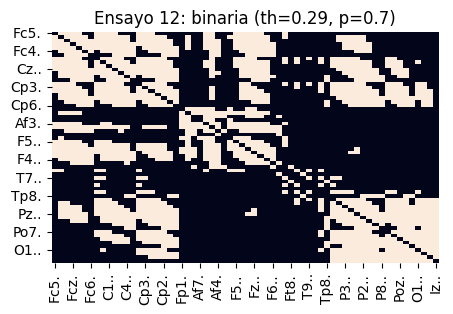

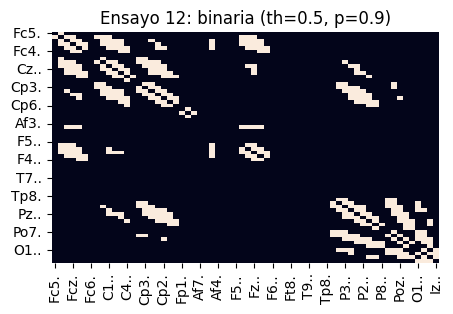

Ensayo 12 - Clustering: 0.6993215294705541 Hub: ('Afz.', 0.07393261532820776)


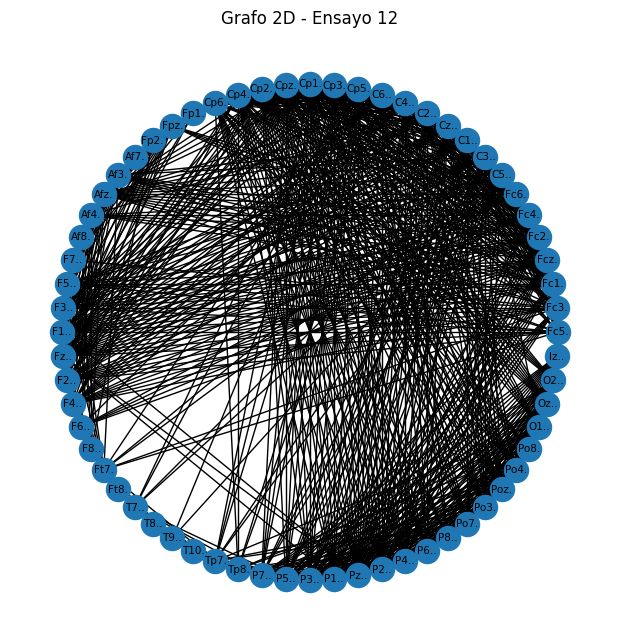

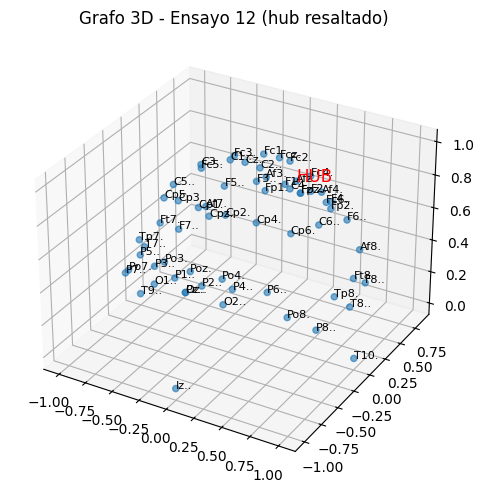

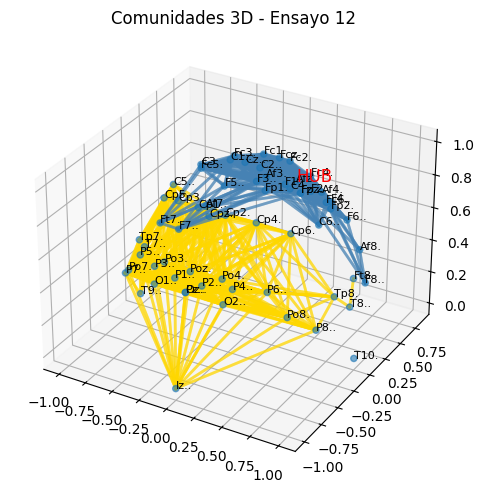


================ Procesando Ensayo 13 ================



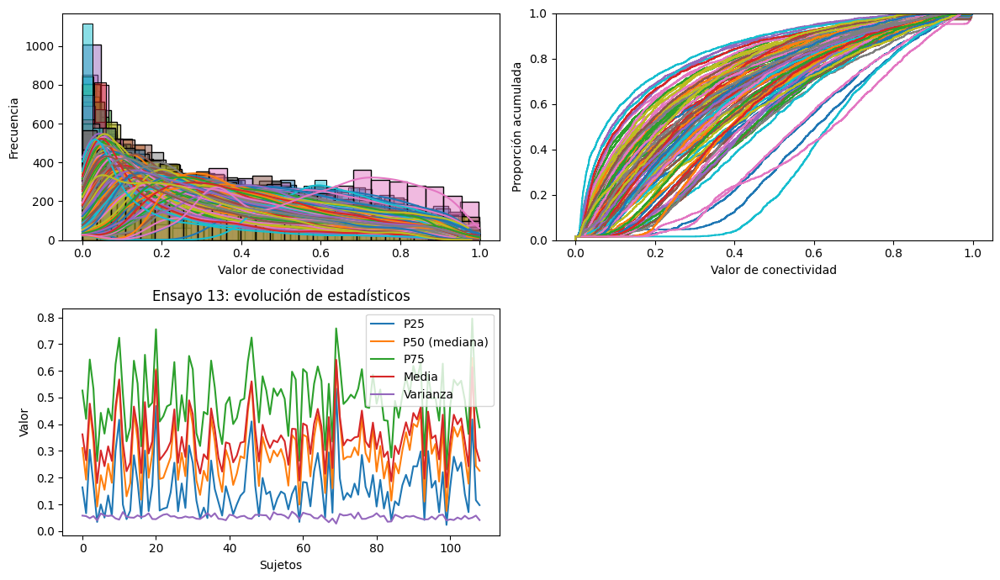

Estadísticos globales Ensayo 13:
              th25      th50      th75     media  mu_sigma
min      0.023209  0.075268  0.230245  0.163582  0.203543
max      0.533470  0.647799  0.795641  0.641332  0.669294
mediana  0.145185  0.284032  0.495978  0.336193  0.394651
mad      0.060777  0.081801  0.075998  0.063807  0.062936
Ensayo 13 - Thresholds: mediana=0.28, p75=0.5, poblacion_media=0.6, poblacion_alta=0.8


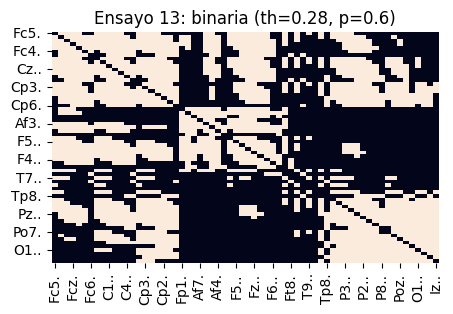

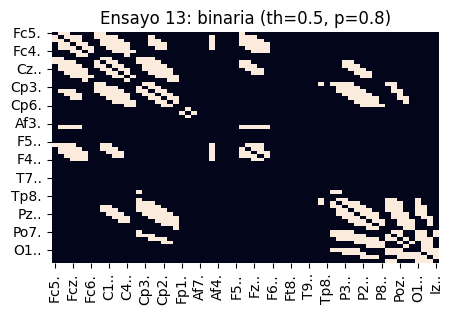

Ensayo 13 - Clustering: 0.742946701680981 Hub: ('Afz.', 0.035216482101698594)


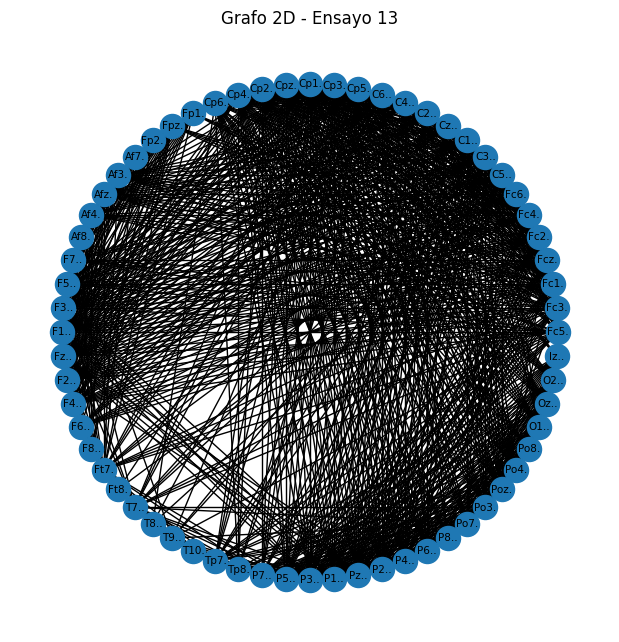

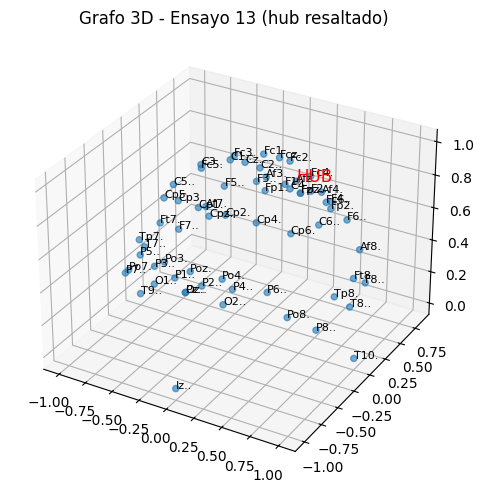

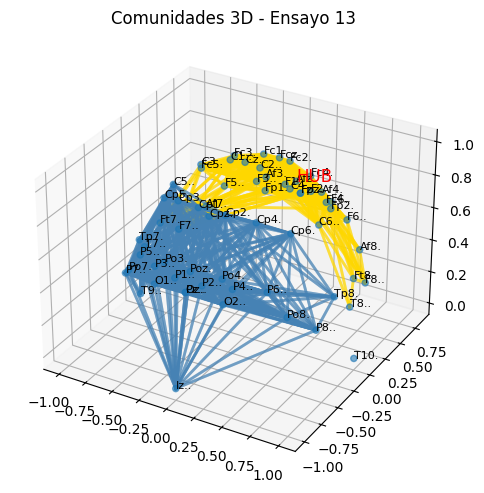

In [10]:
# Lista de rutas de los 14 ensayos
rutas_ensayos =[
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_01.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_02.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_03.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_04.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_05.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_07.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_08.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_09.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_10.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_11.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_12.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_13.xlsx",
    r"C:\Users\apgso\OneDrive\Documentos\modelos-2026-1\Neurociencias-2026-1\S04_parciales\parcial-3\eeg-motor-movementimagery_Ensayo_14.xlsx"
]

# Diccionario para guardar resultados de todos los ensayos
resultados = {}

# Loop principal
for i, ruta in enumerate(rutas_ensayos, start=1):
    nombre = f"Ensayo {i}"
    print(f"\nProcesando {nombre}...\n")
    try:
        resultados[nombre] = procesar_ensayo(ruta, nombre, coords)
    except Exception as e:
        print(f"Error en {nombre}: {e}")